# Time series data. S&P 500 stock prices

In [9]:
from easyesn import PredictionESN
from easyesn import helper as hlp
from sklearn import preprocessing
import numpy as np
from scipy.stats import norm
import seaborn as sns
from scipy.stats import t
import pandas as pd
import math
import networkx as nx
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import tqdm
%matplotlib inline
sns.set()

import warnings 
warnings.filterwarnings('ignore')

# Подготовка данных

In [10]:
tickers = []
filename = "S&P500.txt"
with open(filename) as file:
    lines = file.readlines()
    for line in lines:
        tickers.append(line.rstrip())

In [11]:
Data_for_ticker2 = dict()
file_data = pd.read_csv("S&PDATA.csv")
len(file_data)

575553

In [12]:
grouped = file_data.groupby("Unnamed: 0")

In [13]:
for name, group in grouped:
    Data_for_ticker2[name] = group.drop(["Unnamed: 0"], axis=1).reset_index()

In [14]:
prices = [] 
for ticker, df in Data_for_ticker2.items():
    prices.append((ticker, df['Close']))
prices_df = pd.concat(dict(prices), axis =1)
prices_df.tail()

,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
1172,66.080002,39.520000,161.979996,217.940002,98.019997,88.459999,66.839996,166.869995,262.399994,100.070000,...,57.090000,75.239998,80.400002,38.520000,27.690001,76.639999,84.489998,125.300003,53.669998,89.379997
1173,66.690002,40.689999,162.100006,219.699997,97.260002,88.870003,66.790001,167.669998,263.040009,100.419998,...,57.130001,76.989998,80.279999,39.180000,27.639999,76.419998,85.370003,125.980003,53.520000,89.550003
1174,67.010002,40.500000,163.559998,222.979996,97.580002,89.260002,67.129997,169.770004,268.359985,100.169998,...,57.060001,78.260002,80.860001,39.560001,27.950001,76.860001,85.989998,126.510002,53.680000,89.830002
1175,67.260002,40.400002,161.800003,225.029999,96.790001,90.059998,67.019997,168.630005,266.429993,98.570000,...,57.119999,77.220001,80.510002,39.660000,27.680000,75.910004,85.699997,123.769997,53.169998,89.809998
1176,67.540001,40.480000,164.029999,227.630005,95.980003,89.970001,66.839996,169.070007,263.510010,98.849998,...,57.389999,77.830002,80.169998,39.919998,27.860001,75.910004,86.889999,123.629997,53.290001,90.599998


In [15]:
plot_prices = prices_df[['AAPL', 'IBM', 'MSFT']]
plot_prices2 = plot_prices.rolling(window=40).mean()

In [16]:
plot_prices['mv_apple']=plot_prices2['AAPL']
plot_prices['mv_ibm']=plot_prices2['IBM']
plot_prices['mv_msft']=plot_prices2['MSFT']

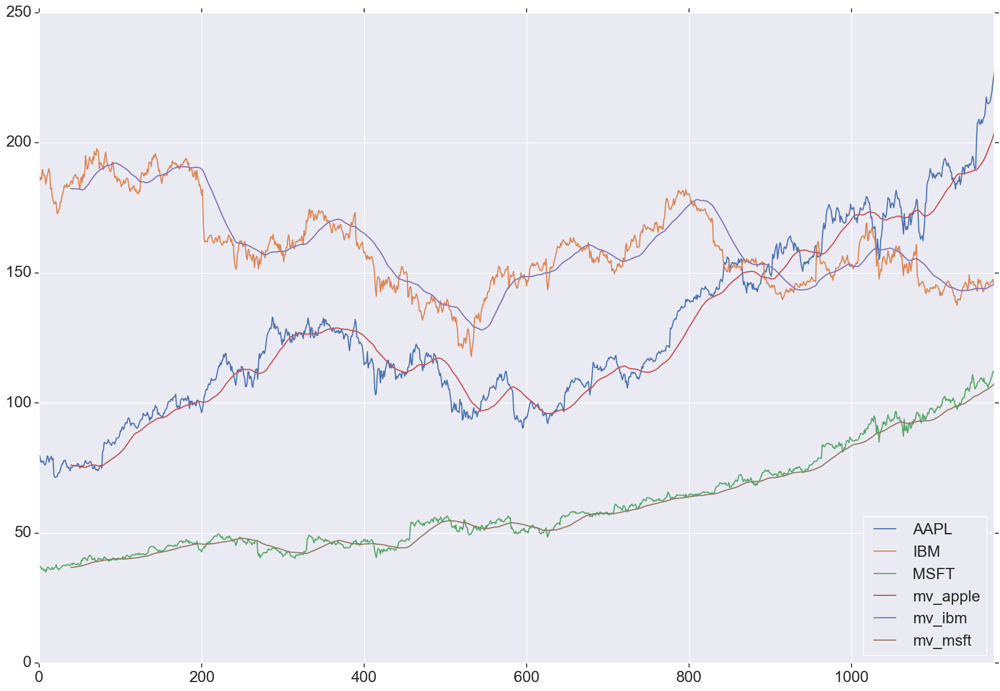

In [17]:
plot_prices.plot(figsize=(22,15), fontsize=20)
plt.legend(loc=4, prop={'size': 20})

In [45]:
prices_df.columns[60:100]

Index(['BAC', 'BAX', 'BBT', 'BBY', 'BDX', 'BEN', 'BF.B', 'BHGE', 'BIIB', 'BK',
       'BKNG', 'BLK', 'BLL', 'BMY', 'BRK.B', 'BSX', 'BWA', 'BXP', 'C', 'CA',
       'CAG', 'CAH', 'CAT', 'CB', 'CBOE', 'CBRE', 'CBS', 'CCI', 'CCL', 'CDNS',
       'CELG', 'CERN', 'CF', 'CHD', 'CHRW', 'CHTR', 'CI', 'CINF', 'CL', 'CLX'],
      dtype='object')

In [19]:
prices_T = prices_df.T
prices_T.head()

,0,1,2,3,4,5,6,7,8,9,...,1167,1168,1169,1170,1171,1172,1173,1174,1175,1176
A,40.908440,40.207439,40.715309,40.515022,41.094421,41.766811,41.781116,42.153076,42.153076,42.832619,...,64.470001,64.930000,65.650002,65.690002,65.980003,66.080002,66.690002,67.010002,67.260002,67.540001
AAL,25.250000,25.360001,26.540001,27.030001,26.910000,27.629999,29.420000,29.350000,28.650000,28.870001,...,39.990002,40.330002,39.189999,38.830002,38.820000,39.520000,40.689999,40.500000,40.400002,40.480000
AAP,110.680000,109.739998,112.879997,111.800003,113.180000,112.300003,113.550003,115.639999,114.290001,117.599998,...,160.839996,160.149994,160.729996,163.259995,164.360001,161.979996,162.100006,163.559998,161.800003,164.029999
AAPL,80.145714,79.018570,77.282860,77.704285,77.148575,77.637146,76.645714,76.134285,76.532860,78.055717,...,215.460007,215.039993,215.050003,215.490005,216.160004,217.940002,219.699997,222.979996,225.029999,227.630005
ABBV,52.810001,51.980000,52.299999,50.389999,50.490002,50.360001,51.220001,50.900002,49.830002,50.599998,...,97.629997,97.739998,97.639999,97.150002,97.400002,98.019997,97.260002,97.580002,96.790001,95.980003


# Первые попытки обучения ESN

In [20]:
# AAPL = prices_df['AAPL'].values

In [21]:
A = prices_df['AAPL']

In [22]:
def train_ones(data, n_res, w2, sp_r = 0.6, l_rate = 0.05):
    esn = PredictionESN(n_input=1, n_output=1, n_reservoir=n_res, spectralRadius=sp_r, leakingRate=l_rate, 
                        regressionParameters=[1e-2], solver="lsqr", feedback=False)
    y1 = []
    y2 = []
    window = 100
    window2 = w2
    for i1 in range(0, len(data)-2*window, window2):
        i2 = i1 + window
        j1 = i2
        j2 = j1 + window2
        InputDataTrain = np.ones(window)
        OutputDataTrain = data[i1:i2]
        InputDataTest = np.ones(window2)
        OutputDataTest = data[j1:j2]

        esn.fit(InputDataTrain, OutputDataTrain, transientTime=9, verbose=0)
        one_step_prediction = esn.predict(InputDataTest)
        y1.append(OutputDataTest.values)
        y2.append(one_step_prediction)
    y1 = [yy for y in y1 for yy in y]
    y2 = [yy[0] for y in y2 for yy in y]
    y2 = y2[:len(y1)]
    x = range(len(y1))
    
    fig = plt.figure(figsize=(16,8))
    plt.title('window ' + str(w2) + ', reservoir=' + str(n_res), fontsize = 20)
    plt.plot(x, y1, label='real')
    plt.plot( x, y2, label='prediction')
    plt.legend()

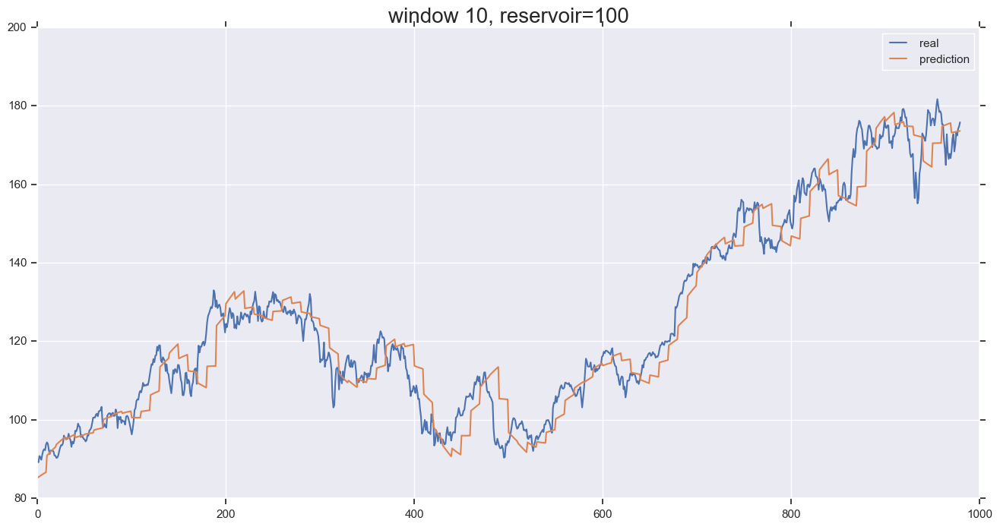

In [23]:
train_ones(A, 100, 10)

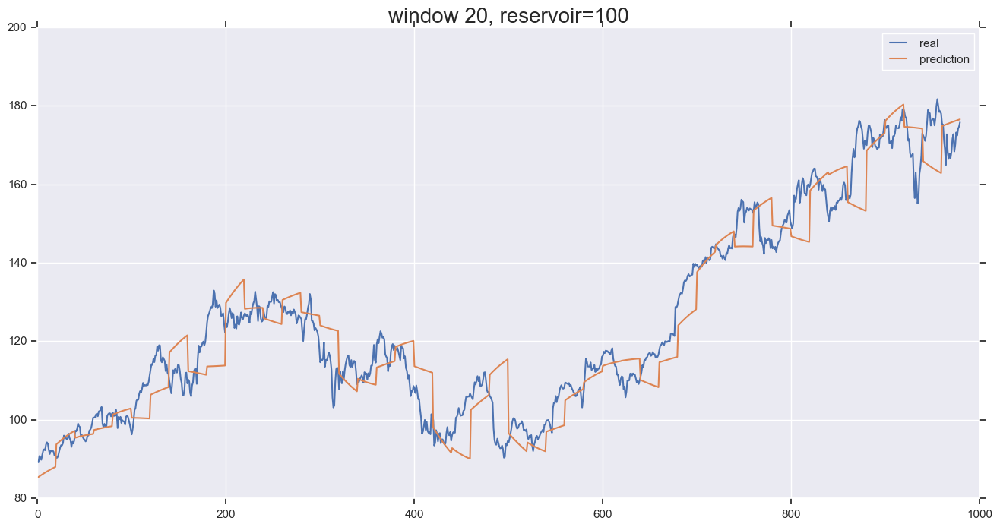

In [24]:
train_ones(A, 100, 20)

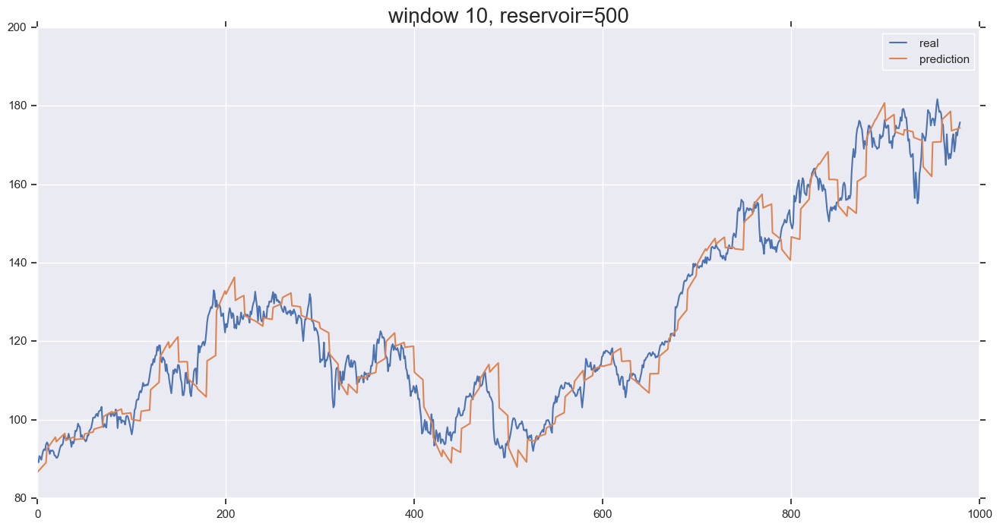

In [25]:
train_ones(A, 500, 10)

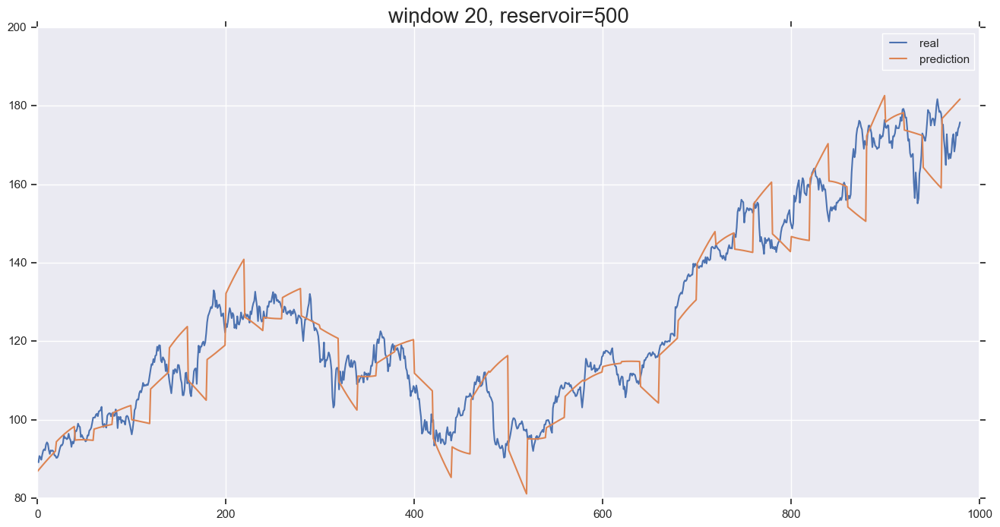

In [26]:
train_ones(A, 500, 20)

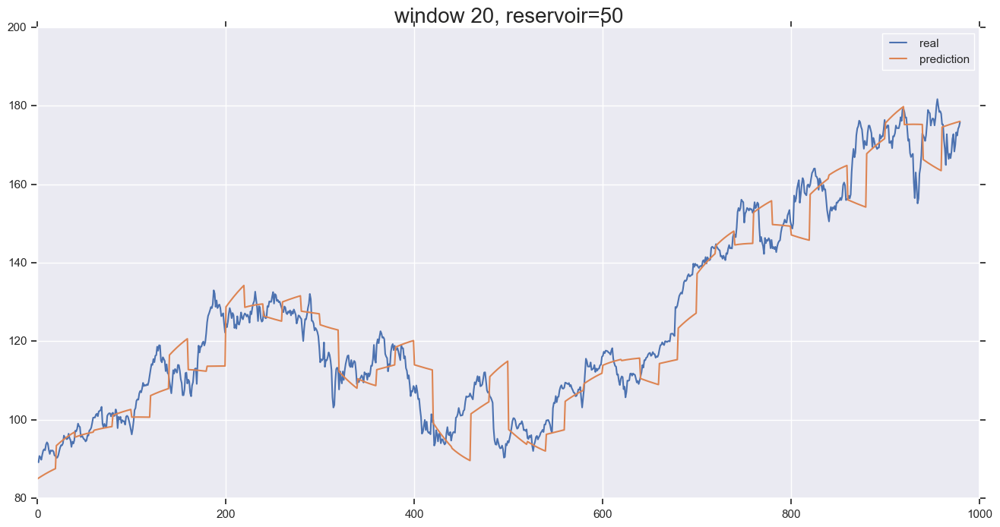

In [27]:
train_ones(A, 50, 20)

# Неудачные эксперименты с параметрами

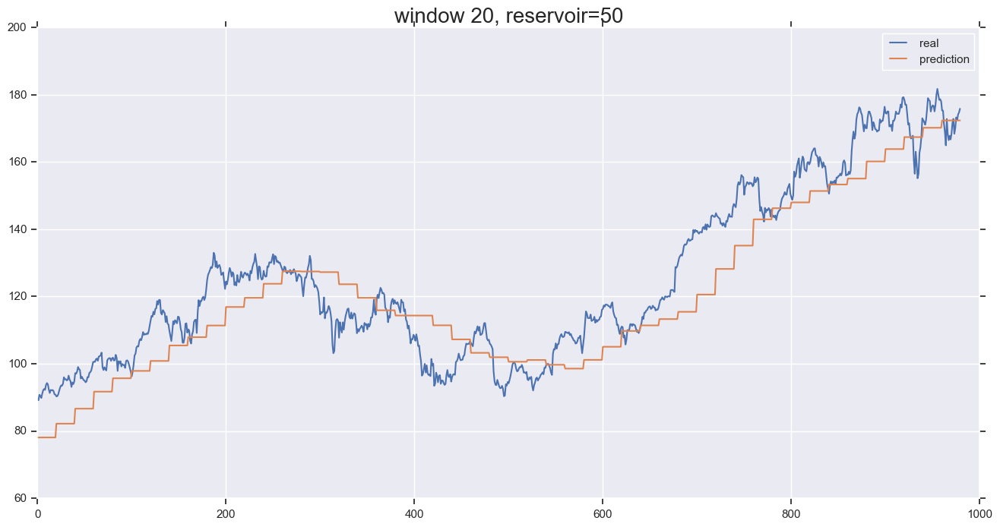

In [28]:
train_ones(A, 50, 20, 0.8, 0.4)

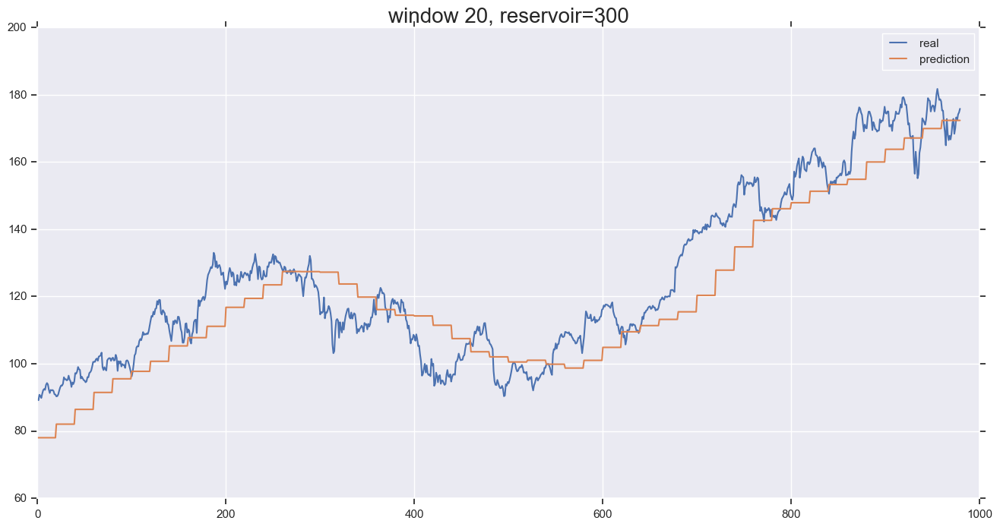

In [29]:
train_ones(A, 300, 20, 0.8, 0.7)

In [30]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(20, 10), dpi=80, facecolor='w', edgecolor='k')

## Эксперименты с доходностями

In [31]:
returns_df=prices_df.apply(lambda x: np.log(x) - np.log(x.shift(1)))
returns_df = returns_df.drop(df.index[0])

In [32]:
MSFT = returns_df['MSFT']

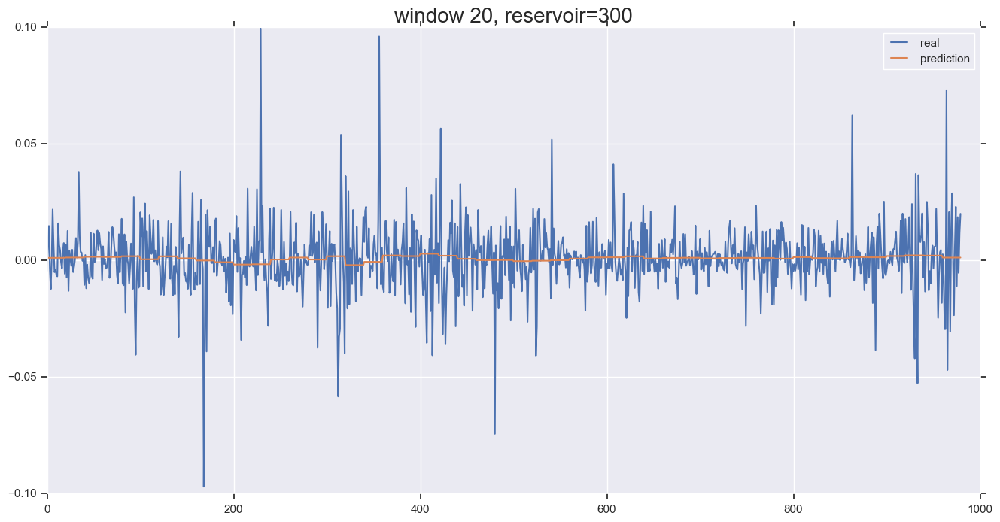

In [33]:
train_ones(MSFT, 300, 20, 0.8, 0.75)

## Зависимости ошибок от различных параметров


In [34]:
x =[]
err1 = []
err2 = []
window2 = 20
windows = range(10, len(MSFT)-window2, 10)
for w in windows:
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=1, n_output=1, n_reservoir=300, spectralRadius=0.8, leakingRate=0.75, feedback=False, randomSeed = z)
        InputDataTrain = np.ones(w)
        OutputDataTrain = MSFT[0:w]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[w:w+window2]
        esn.fit(InputDataTrain, OutputDataTrain, transientTime=5, verbose=0)
        one_step_prediction = esn.predict(InputDataTest)
        error1.append(np.mean((one_step_prediction.T[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction.T[0]-OutputDataTest)))
        del esn
        
    x.append(w)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))

In [28]:
err1[-10:]

[0.0006908036011656265,
 0.00026193015196251625,
 0.00016062280893966522,
 6.662842323993939e-05,
 6.705203871854934e-05,
 0.00010290404518673336,
 0.00011451402279065224,
 0.00014559765632825191,
 0.00014633773291090584,
 9.60928601593789e-05]

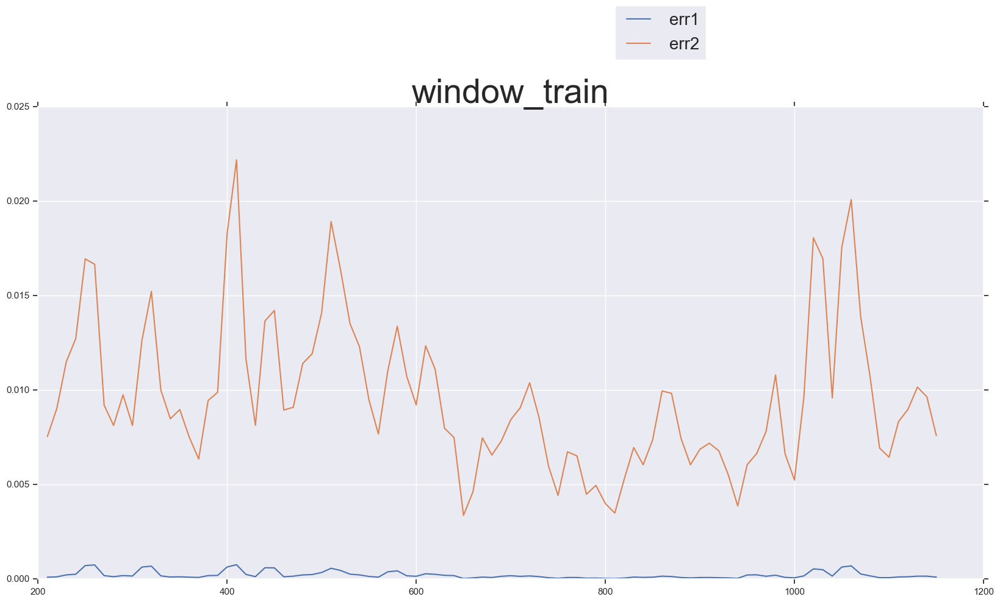

In [29]:
plt.title('window_train', fontsize=40)
plt.plot(x[20:], err1[20:], label='err1')
plt.plot( x[20:], err2[20:], label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### window_test

In [30]:
x =[]
err1 = []
err2 = []
window = 500
windows = range(5, window, 5)
for w in windows:
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=1, n_output=1, n_reservoir=300, spectralRadius=0.8, leakingRate=0.75, feedback=False)
        
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(w)
        OutputDataTest = MSFT[window:window+w]
        esn.fit(InputDataTrain, OutputDataTrain, transientTime=9, verbose=0)
        one_step_prediction = esn.predict(InputDataTest)
        error1.append(np.mean((one_step_prediction.T[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction.T[0]-OutputDataTest)))
    
    x.append(w)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))   

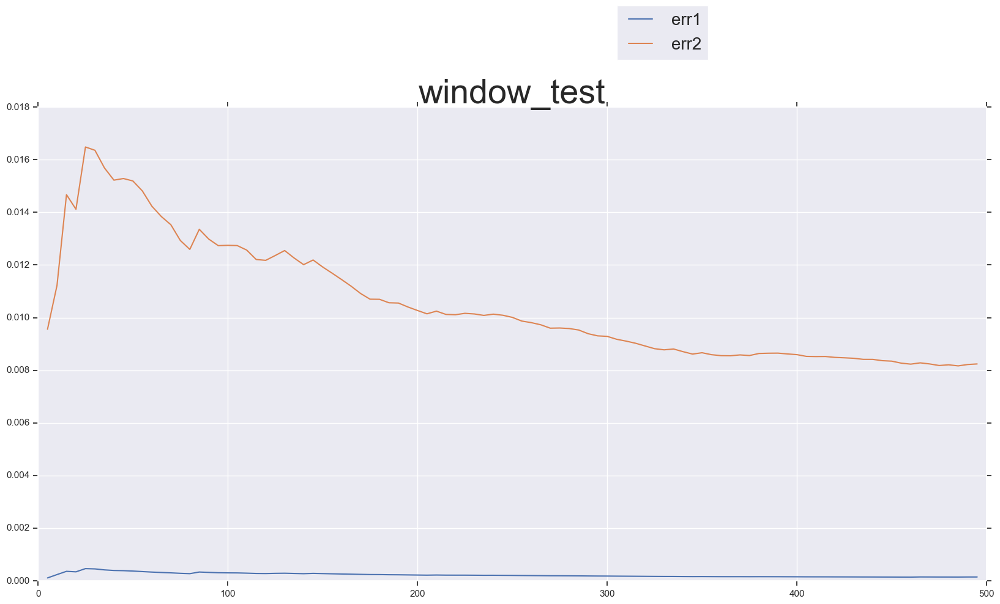

In [31]:
plt.title('window_test', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### n_reservoir

In [32]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for n in range(50, 500, 50):
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=1, n_output=1, n_reservoir=n, spectralRadius=0.8, leakingRate=0.75, feedback=False)
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[window:window+window2]
        esn.fit(InputDataTrain, OutputDataTrain, transientTime=9, verbose=0)
        one_step_prediction = esn.predict(InputDataTest)
        error1.append(np.mean((one_step_prediction.T[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction.T[0]-OutputDataTest)))
    
    x.append(n)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))

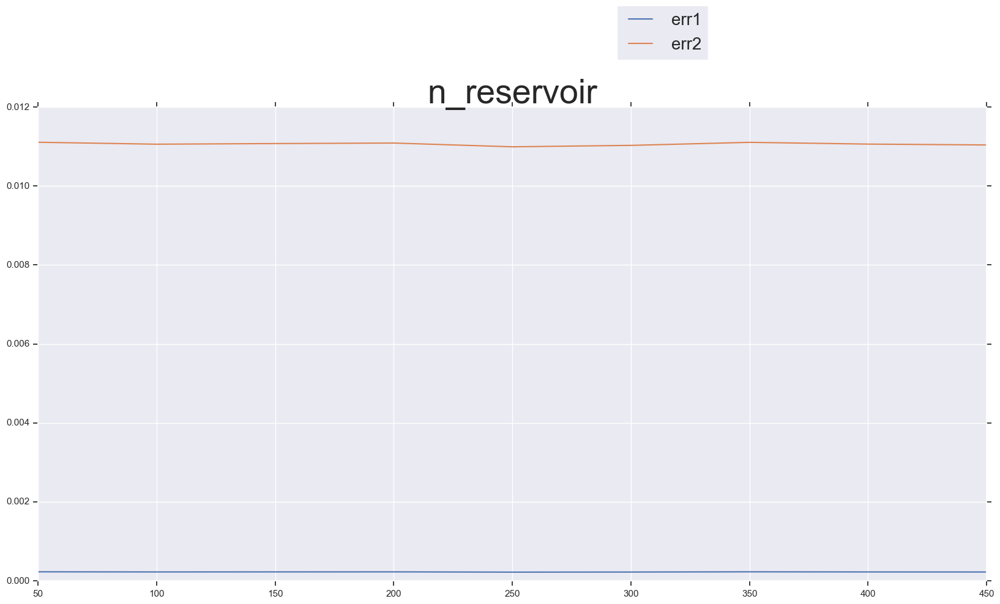

In [33]:
plt.title('n_reservoir', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### leakingRate

In [34]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for n in np.arange(0.1, 1.0, 0.05):
    esn = PredictionESN(n_input=1, n_output=1, n_reservoir=300, spectralRadius=0.8, leakingRate=n, feedback=False)
    x.append(n)
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[0:window]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[window:window+window2]
    esn.fit(InputDataTrain, OutputDataTrain, transientTime=9, verbose=0)
    one_step_prediction = esn.predict(InputDataTest)
    err1.append(np.mean((one_step_prediction.T[0]-OutputDataTest)**2))
    err2.append(np.mean(np.abs(one_step_prediction.T[0]-OutputDataTest)))

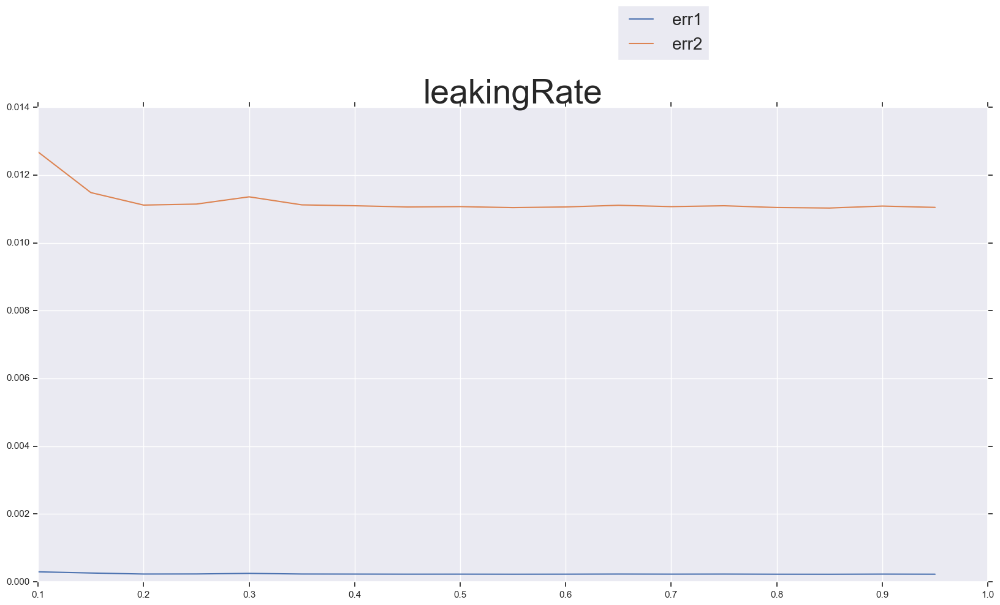

In [35]:
plt.title('leakingRate', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### transientTime

In [36]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for n in np.arange(5, window, 10):
    esn = PredictionESN(n_input=1, n_output=1, n_reservoir=300, spectralRadius=0.8, leakingRate=0.75, feedback=False)
    x.append(n)
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[0:window]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[window:window+window2]
    esn.fit(InputDataTrain, OutputDataTrain, transientTime=n, verbose=0)
    one_step_prediction = esn.predict(InputDataTest)
    err1.append(np.mean((one_step_prediction.T[0]-OutputDataTest)**2))
    err2.append(np.mean(np.abs(one_step_prediction.T[0]-OutputDataTest)))

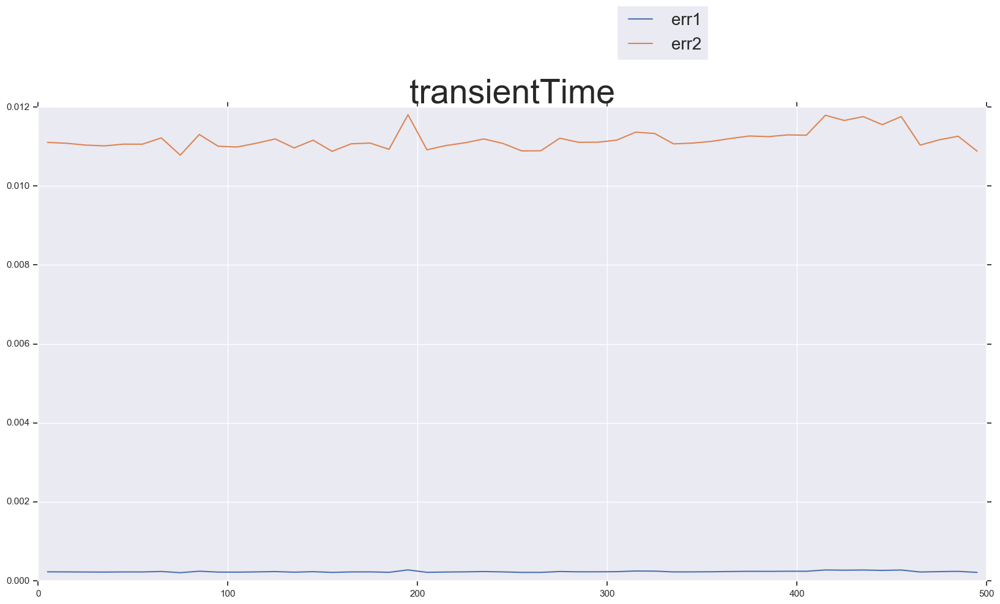

In [37]:
plt.title('transientTime', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### spectralRadius

In [38]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for n in np.arange(0.6, 1.0, 0.01):
    esn = PredictionESN(n_input=1, n_output=1, n_reservoir=300, spectralRadius=n, leakingRate=0.75, feedback=False)
    x.append(n)
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[0:window]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[window:window+window2]
    esn.fit(InputDataTrain, OutputDataTrain, transientTime=9, verbose=0)
    one_step_prediction = esn.predict(InputDataTest)
    err1.append(np.mean((one_step_prediction.T[0]-OutputDataTest)**2))
    err2.append(np.mean(np.abs(one_step_prediction.T[0]-OutputDataTest)))

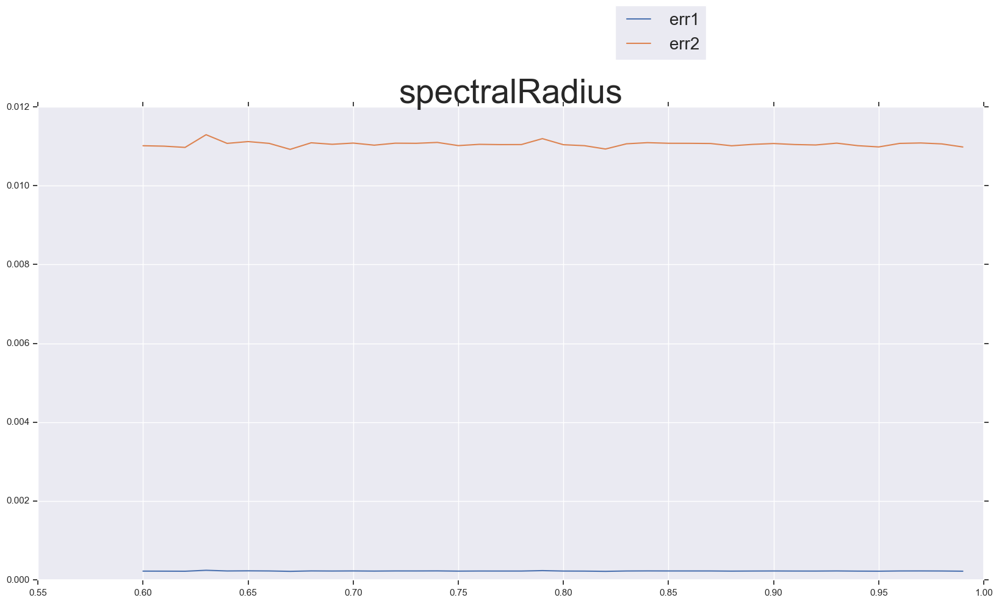

In [39]:
plt.title('spectralRadius', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

# generate

In [40]:
esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.5, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
y1 = []
y2 = []
window = 150
window2 = 20
for i1 in range(0, len(MSFT)-700, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[j1:j2]
    
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
    y1.append(OutputDataTest.values)
    y2.extend(one_step_prediction.tolist())
y1 = [yy for y in y1 for yy in y]
y2 = [yy for y in y2 for yy in y]
x = range(len(y1))

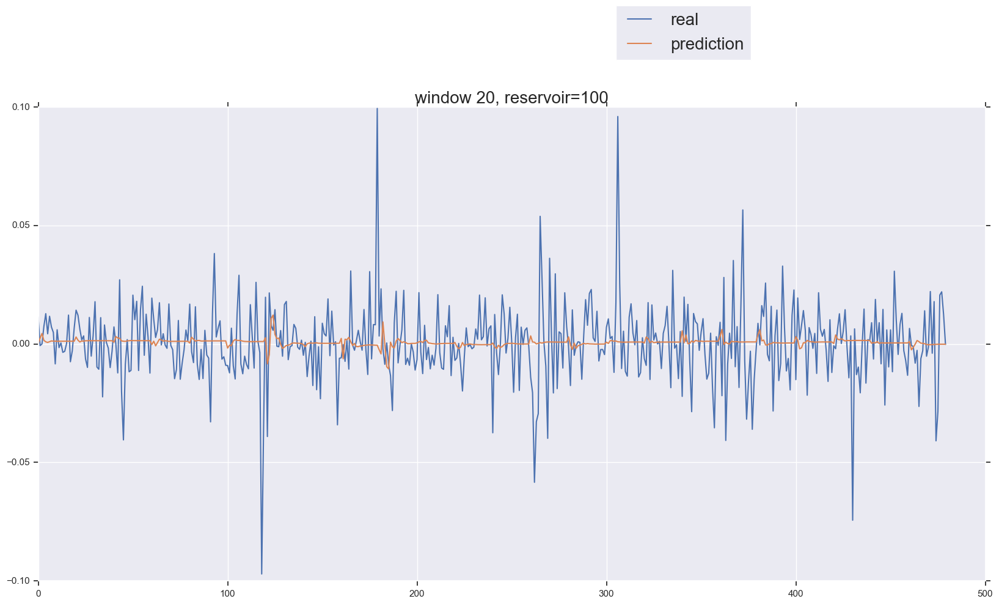

In [41]:
plt.title('window 20, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction')
plt.legend(loc=(0.61,1.1), fontsize=20)

## Зависимости ошибок от различных параметров
### window_train

In [42]:
x =[]
err1 = []
err2 = []
window2 = 20
windows = range(20, len(MSFT)-window2, 10)
for w in windows:
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.5, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
        InputDataTrain = np.ones(w)
        OutputDataTrain = MSFT[0:w]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[w:w+window2]
        
        esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
        one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
        one_step_prediction = esn.predict(InputDataTest)
        error1.append(np.mean((one_step_prediction[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction[0]-OutputDataTest)))
        del esn
        
    x.append(w)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))

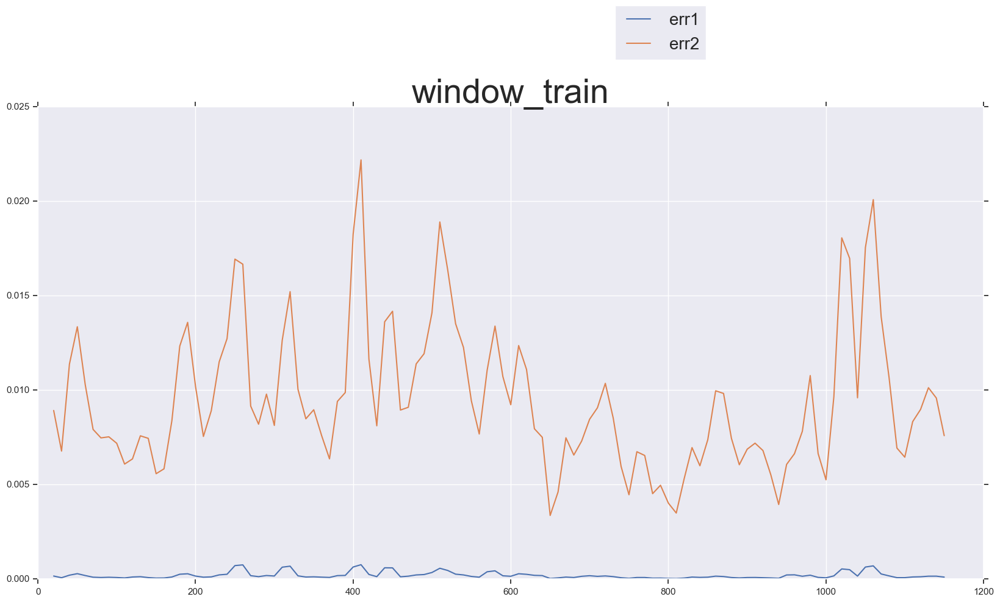

In [43]:
plt.title('window_train', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### window test

In [44]:
x =[]
err1 = []
err2 = []
window = 500
windows = range(5, window , 5)
for w in windows:
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.5, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
        
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(w)
        OutputDataTest = MSFT[window:window+w]
        
        esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
        one_step_prediction = esn.generate(n=w, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
        
        error1.append(np.mean((one_step_prediction[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction[0]-OutputDataTest)))
        del esn
        
    x.append(w)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))

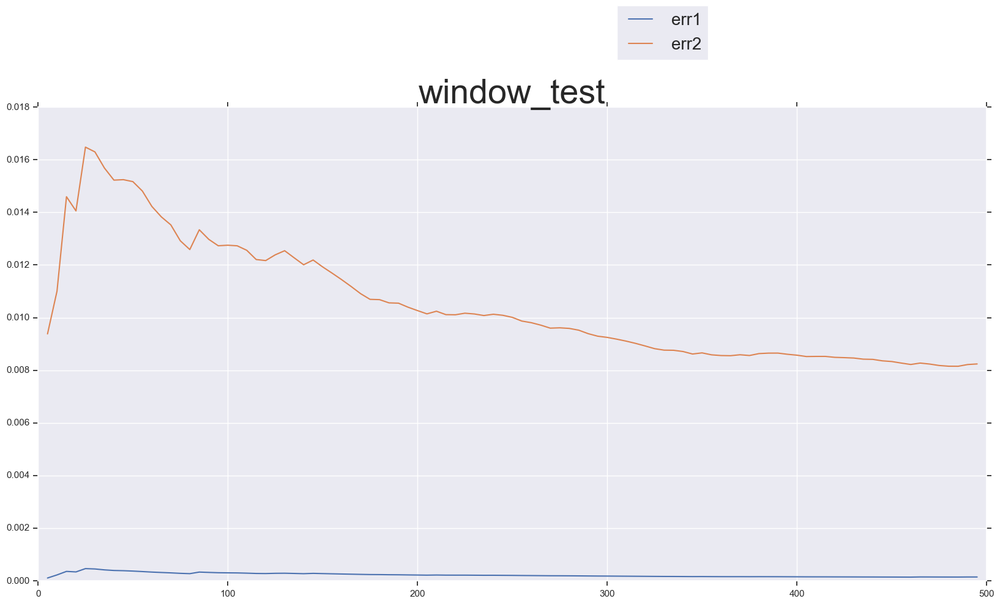

In [45]:
plt.title('window_test', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### n_reservoir

In [46]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for n_r in range(50, 500, 50):
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=0, n_output=1, n_reservoir=n_r, spectralRadius=0.5, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[window:window+window2]
        
        esn.fit(None, OutputDataTrain, transientTime=5, verbose=0)
        one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
        
        error1.append(np.mean((one_step_prediction[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction[0]-OutputDataTest)))
        del esn
    x.append(n_r)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2)) 

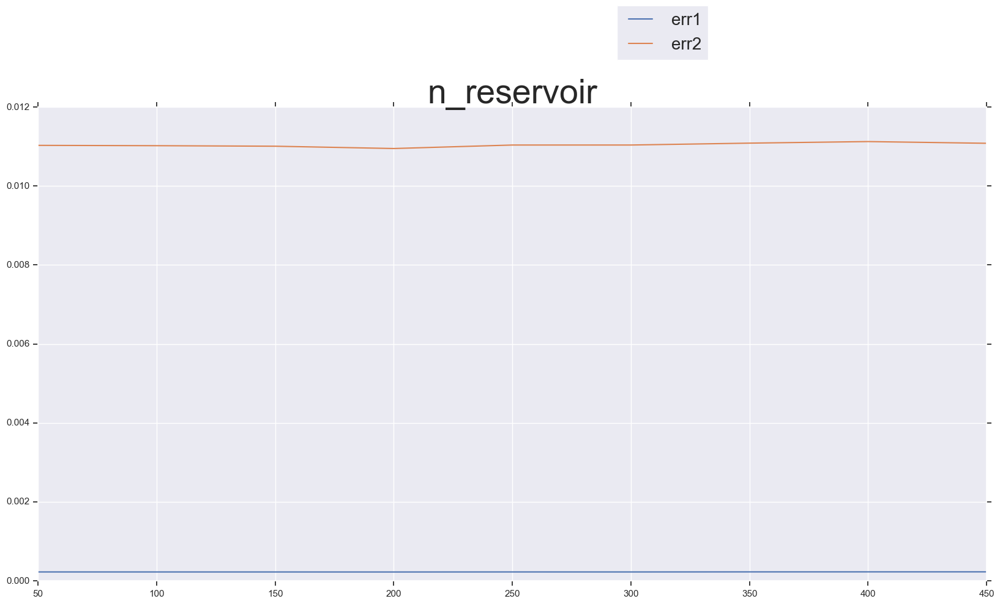

In [47]:
plt.title('n_reservoir', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### leakingRate

In [48]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for lr in np.arange(0.1, 1.0, 0.05):
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.5, leakingRate=lr, regressionParameters=[1e-5], solver="lsqr", feedback=True)
        
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[window:window+window2]
        esn.fit(None, OutputDataTrain, transientTime=5, verbose=0)
        one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
        error1.append(np.mean((one_step_prediction[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction[0]-OutputDataTest)))
        del esn
    
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))
    x.append(lr)

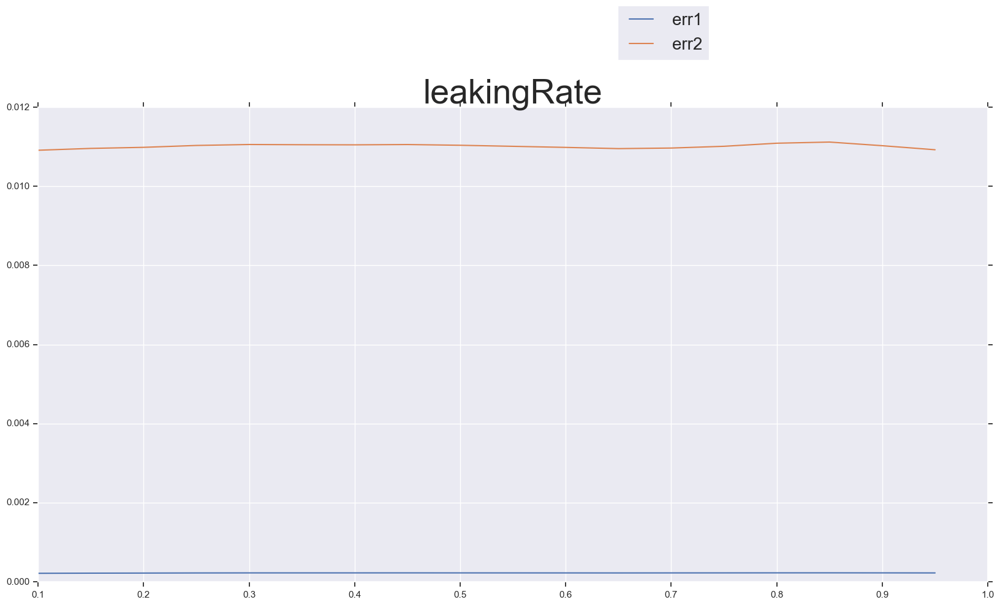

In [49]:
plt.title('leakingRate', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### transientTime

In [50]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for tt in np.arange(5, window, 10):
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.5, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
    
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[window:window+window2]
        esn.fit(None, OutputDataTrain, transientTime=tt, verbose=0)
        one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
        error1.append(np.mean((one_step_prediction[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction[0]-OutputDataTest)))
        del esn
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))
    x.append(tt)

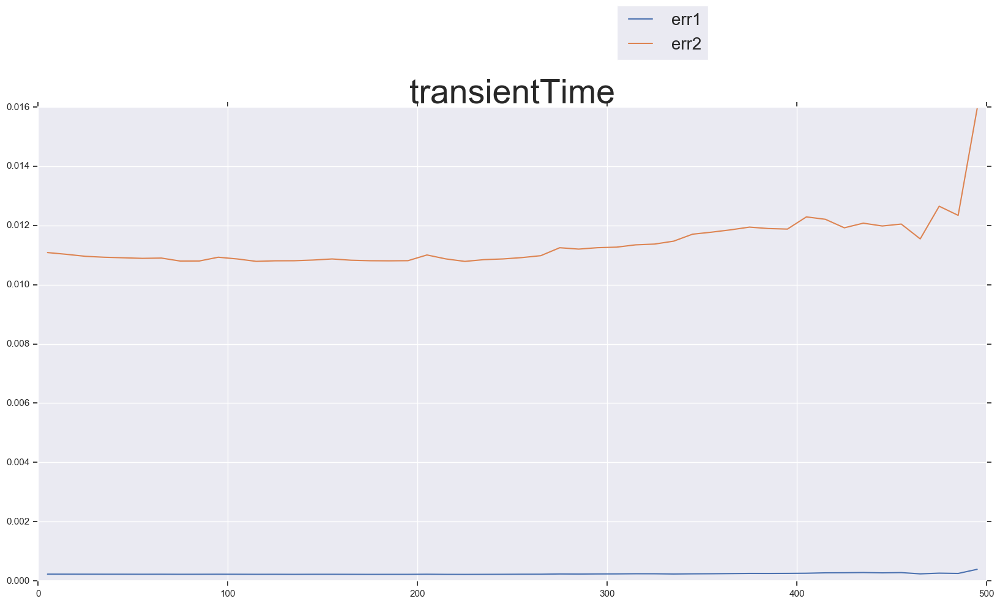

In [51]:
plt.title('transientTime', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

### spectralRadius

In [52]:
x = []
err1 = []
err2 = []
window = 500
window2 = 10
for sr in np.arange(0.5, 1.0, 0.01):
    for z in range(10):
        error1 = []
        error2 = []
        esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=sr, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
        
        InputDataTrain = np.ones(window)
        OutputDataTrain = MSFT[0:window]
        InputDataTest = np.ones(window2)
        OutputDataTest = MSFT[window:window+window2]
    
        esn.fit(None, OutputDataTrain, transientTime=9, verbose=0)
        one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
        error1.append(np.mean((one_step_prediction[0]-OutputDataTest)**2))
        error2.append(np.mean(np.abs(one_step_prediction[0]-OutputDataTest)))
        del esn
        
    x.append(sr)
    err1.append(np.mean(error1))
    err2.append(np.mean(error2))

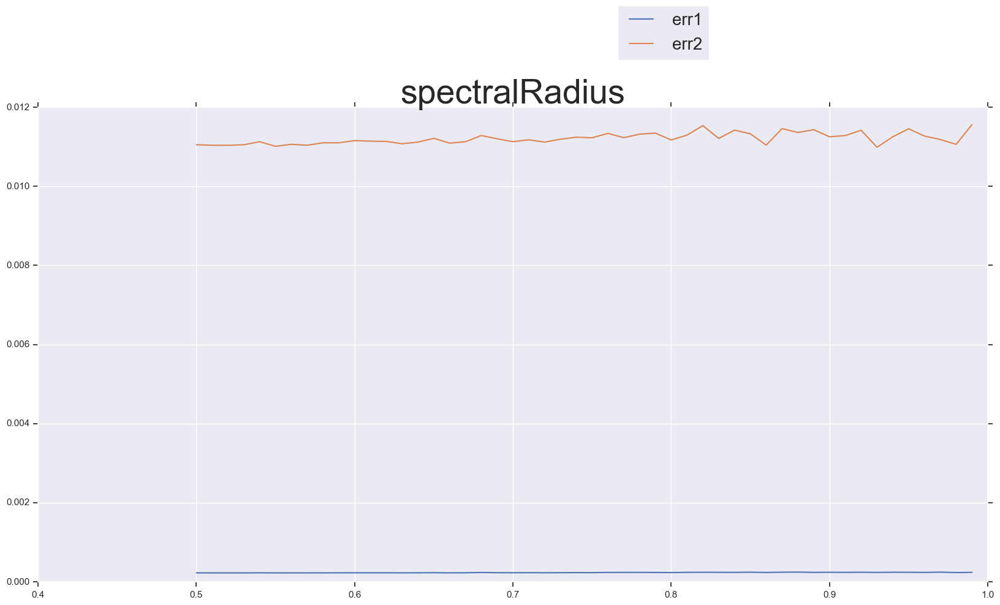

In [53]:
plt.title('spectralRadius', fontsize=40)
plt.plot(x, err1, label='err1')
plt.plot( x, err2, label='err2')
plt.legend(loc=(0.61,1.1), fontsize=20)

# Prices

In [35]:
MSFT_pr = prices_df['MSFT']

In [55]:
esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.5, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
y1 = []
y2 = []
window = 150
window2 = 20
for i1 in range(0, len(MSFT_pr)-700, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT_pr[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT_pr[j1:j2]
    
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
    y1.append(OutputDataTest.values)
    y2.extend(one_step_prediction.tolist())
y1 = [yy for y in y1 for yy in y]
y2 = [yy for y in y2 for yy in y]
x = range(len(y1))

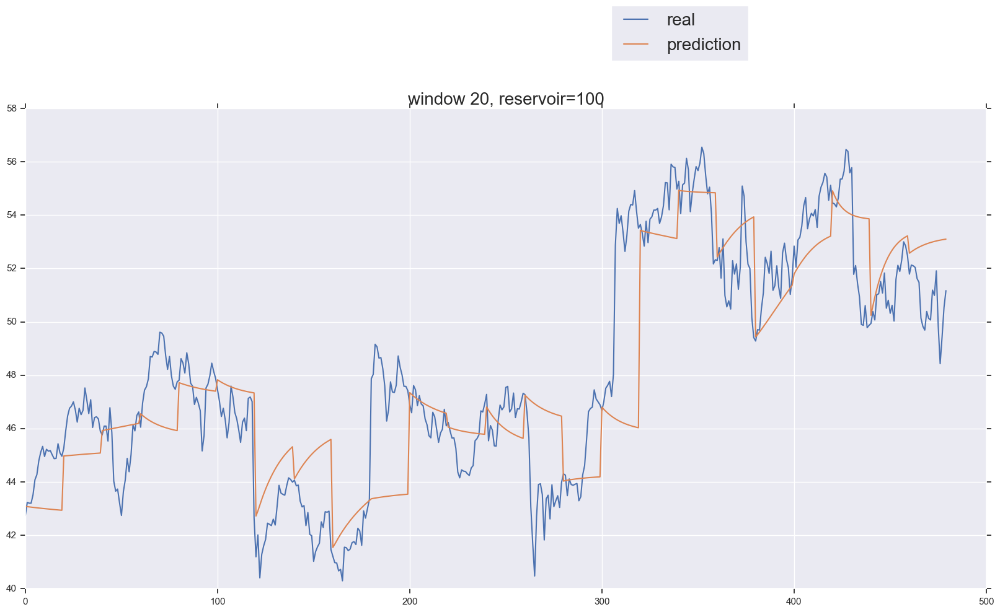

In [56]:
plt.title('window 20, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction')
plt.legend(loc=(0.61,1.1), fontsize=20)

In [57]:
#Скользящее среднее

esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, spectralRadius=0.71, leakingRate=0.95,
                    regressionParameters=[1e-3], solver="lsqr", feedback=True)
y1 = []
y2 = []
window = 40
window2 = 10
for i1 in range(0, len(MSFT)-900, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[j1:j2]
    
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
    y1.append(OutputDataTest.values)
    y2.extend(one_step_prediction.tolist())
    
y1 = [yy for y in y1 for yy in y]
y2 = [yy for y in y2 for yy in y]
x = range(len(y1))
y3 = MSFT.iloc[window:-(896-window)].rolling(window=10, min_periods=1).mean()

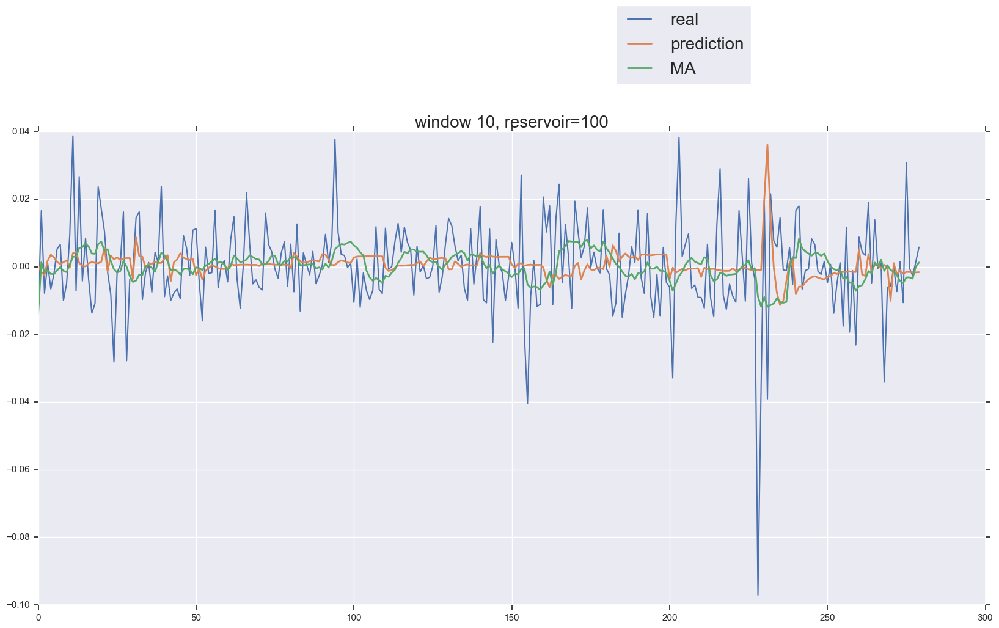

In [58]:
plt.title('window 10, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction', lw=2)
plt.plot( x, y3, label='MA', lw=2)
plt.legend(loc=(0.61,1.1), fontsize=20)

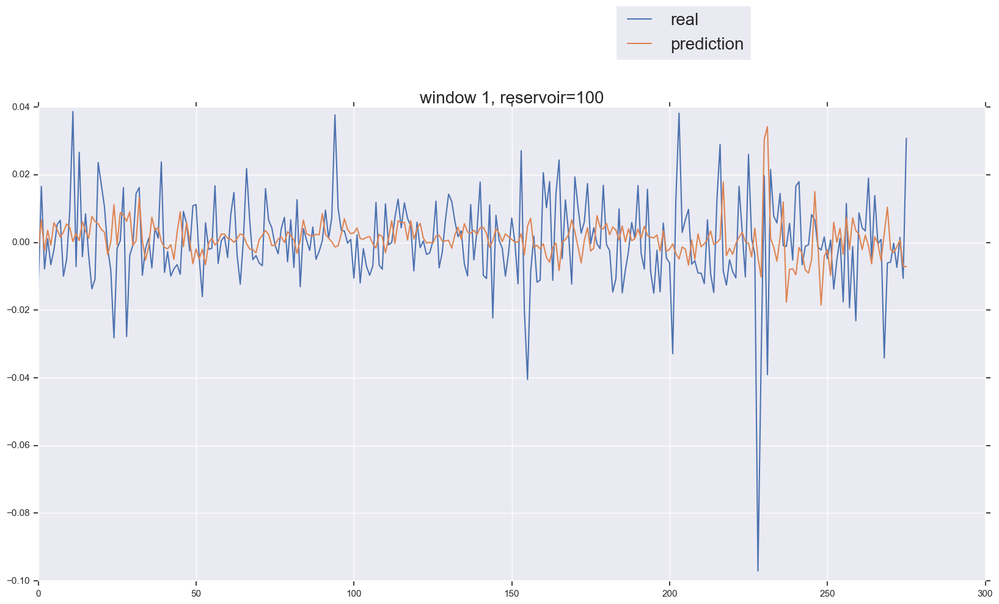

In [59]:
#предсказание на 1 день вперёд, изменили параметры, добавили шум
esn = PredictionESN(n_input=0, n_output=1, noiseLevel=0.02, n_reservoir=100, spectralRadius=0.5, leakingRate=0.55, 
                    regressionParameters=[1e-3], solver="lsqr", feedback=True)
y1 = []
y2 = []
window = 40
window2 = 1
for i1 in range(0, len(MSFT)-900, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[j1:j2]
    
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
    y1.append(OutputDataTest.values)
    y2.extend(one_step_prediction.tolist())
    
y1 = [yy for y in y1 for yy in y]
y2 = [yy for y in y2 for yy in y]
x = range(len(y1))

plt.title('window 1, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction')
plt.legend(loc=(0.61,1.1), fontsize=20)

# Обучение на многомерных данных (нескольких активах)

In [60]:
plot_prices = prices_df[['AAPL', 'IBM', 'MSFT']]
returns_df=plot_prices.apply(lambda x: np.log(x) - np.log(x.shift(1)))
returns_df = returns_df.drop(df.index[0])
rets = returns_df[['AAPL', 'IBM', 'MSFT']]

In [61]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.5, leakingRate=0.55, 
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
y_r = []
y_pr = []
window = 40
window2 = 1
for i1 in range(0, len(rets)-900, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = rets.iloc[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = rets.iloc[j1:j2]
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=np.reshape(OutputDataTrain.iloc[-1].values, (3,-1)))
    y_r.append(OutputDataTest.values)
    y_pr.append(one_step_prediction)
y_pr = np.reshape(y_pr, np.shape(y_r))
print(np.shape(y_r))
print(np.shape(y_pr))
y_r = [yy for y in y_r for yy in y]
y_pr = [yy for y in y_pr for yy in y]
x = range(len(y_r))

(276, 1, 3)
(276, 1, 3)


In [62]:
real = pd.DataFrame.from_records(y_r, columns = rets.columns)
predict = pd.DataFrame.from_records(y_pr, columns = rets.columns)

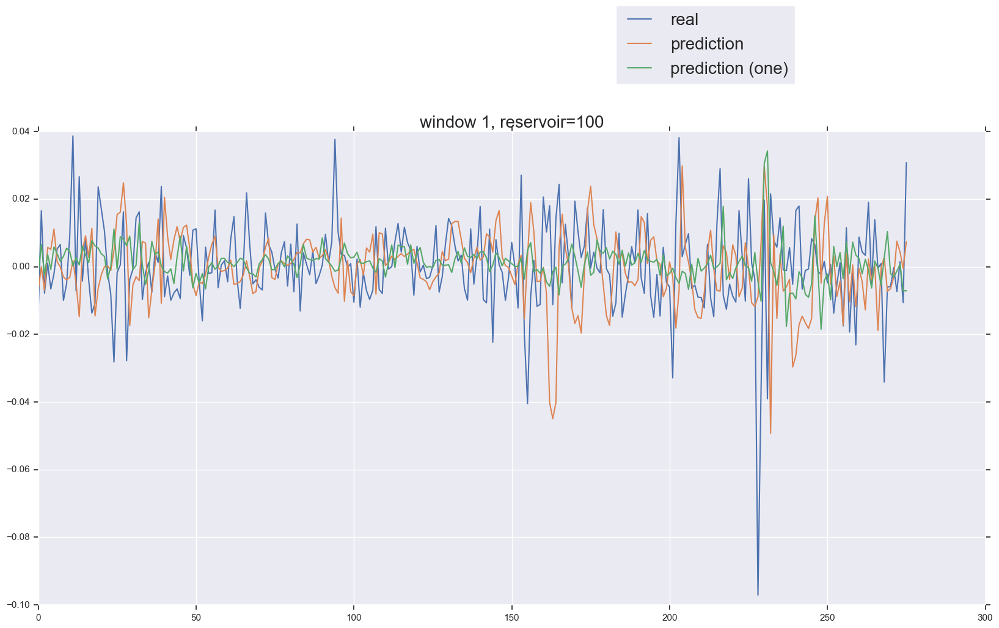

In [63]:
# сравнение предсказаний при обучении  только одним и сразу тремя

plt.title('window 1, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, real['MSFT'], label='real')
plt.plot( x, predict['MSFT'], label='prediction')
plt.plot( x, y2, label='prediction (one)')
plt.legend(loc=(0.61,1.1), fontsize=20)

### Можно заметить, что предсказания с помощью одномерных данных получаются лучше. Это можно объяснить тем, что при использовании многомерных данных, каждое измерение в отдельности по-своему влияет на состояние резервуара, и тем самым влияет и на выходы для других измерений, т.е. вносит неразбериху в работу системы

In [64]:
result = pd.concat([real['MSFT'], predict['MSFT']], axis = 1)
result.columns = ['real','predict']
result['prediction(one)'] = y2

In [65]:
result.head()

,real,predict,prediction(one)
0,-0.013931,-0.007075,-0.002130
1,0.016538,-0.000038,0.006622
2,-0.007841,-0.006953,-0.002418
3,0.001049,0.005734,0.003608
4,-0.006575,0.005104,-0.000816


In [66]:
print('Среднее отклонение при обучении тремя: ', round(np.mean(abs(result['real'] - result['predict'])), 3))
print('Среднее отклонение при обучении только MSFT: ', round(np.mean(abs(result['real'] - result['prediction(one)'])), 3))

Среднее отклонение при обучении тремя:  0.013
Среднее отклонение при обучении только MSFT:  0.01


# Обучение по всем активам

In [67]:
returns_df=prices_df.apply(lambda x: np.log(x) - np.log(x.shift(1)))
returns_df = returns_df.drop(df.index[0])


esn = PredictionESN(n_input=0, n_output=len(returns_df.columns), n_reservoir=100, spectralRadius=0.5, leakingRate=0.55, regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
y_r = []
y_pr = []
window = 40
window2 = 1
for i1 in range(0, len(returns_df)-900, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = returns_df.iloc[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = returns_df.iloc[j1:j2]
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=np.reshape(OutputDataTrain.iloc[-1].values, (3,-1)))
    y_r.append(OutputDataTest.values)
    y_pr.append(one_step_prediction)
y_pr = np.reshape(y_pr, np.shape(y_r))
y_r = [yy for y in y_r for yy in y]
y_pr = [yy for y in y_pr for yy in y]

In [68]:
predict_all = pd.DataFrame.from_records(y_pr, columns = returns_df.columns)

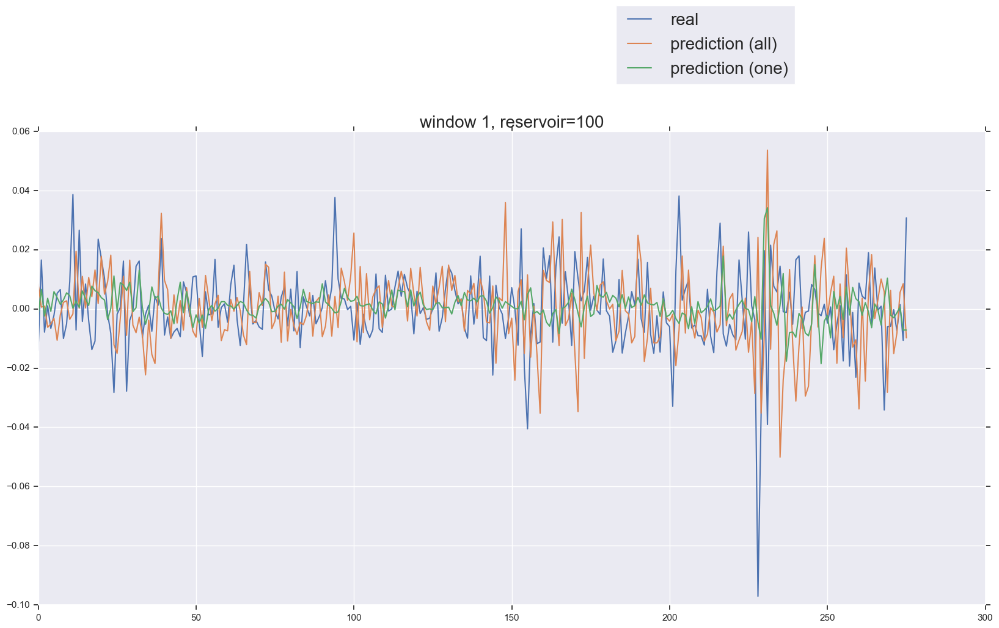

In [69]:
# Сравнение предсказаний при обучении по всем и по одному
plt.title('window 1, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, real['MSFT'], label='real')
plt.plot( x, predict_all['MSFT'], label='prediction (all)')
plt.plot( x, y2, label='prediction (one)')
plt.legend(loc=(0.61,1.1), fontsize=20)

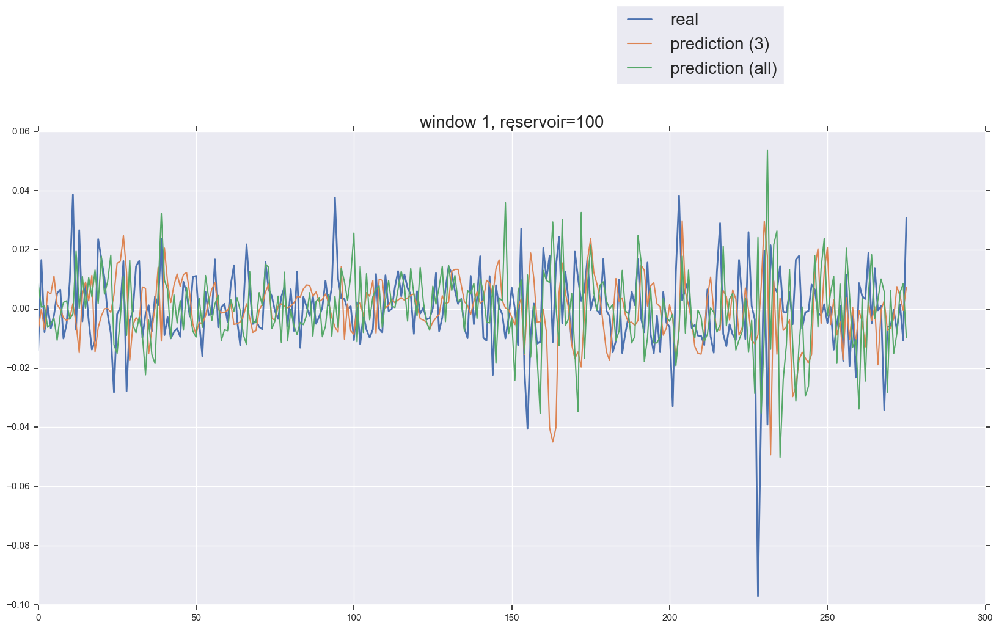

In [70]:
# Сравнение предсказаний при обучении по всем и по трём
plt.title('window 1, reservoir=100', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, real['MSFT'], label='real', lw=2)
plt.plot( x, predict['MSFT'], label='prediction (3)')
plt.plot( x, predict_all['MSFT'], label='prediction (all)')
plt.legend(loc=(0.61,1.1), fontsize=20)

In [71]:
print('Среднее отклонение при обучении всеми: ', round(np.mean(abs(real['MSFT'] - predict_all['MSFT'])), 3))

Среднее отклонение при обучении всеми:  0.014


# PCA states

In [72]:
state = esn.GetState()  
print(state.shape)
state[:10]

(100, 1)


array([[-0.38802513],
       [ 0.33541121],
       [-0.01108909],
       [ 0.37644199],
       [-0.1783724 ],
       [ 0.54471422],
       [ 0.25228266],
       [-0.46891666],
       [ 0.33154062],
       [-0.01910599]])

In [73]:
esn = PredictionESN(n_input=0, n_output=1, n_reservoir=100, 
                                spectralRadius=0.5, leakingRate=0.55, regressionParameters=[1e-5], 
                                solver = 'lsqr', feedback=True)
states = pd.DataFrame([], columns = range(41, len(MSFT)-39))
window = 40
window2 = 1
for i1 in range(0, len(MSFT)-40, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT.iloc[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT.iloc[j1:j2]
    esn.fit(None, OutputDataTrain, transientTime=10, verbose=0)
    sss = []
    state = esn.GetState()
    for z in range(len(state)):
        sss.append(state[z][0])
    states[j2] = sss

In [74]:
states.head()

,41,42,43,44,45,46,47,48,49,50,...,1167,1168,1169,1170,1171,1172,1173,1174,1175,1176
0,-0.488146,-0.488324,-0.486528,-0.488320,-0.486991,-0.487370,-0.486970,-0.487240,-0.487804,-0.487942,...,-0.487279,-0.487448,-0.487040,-0.486854,-0.488091,-0.487872,-0.487956,-0.488137,-0.487788,-0.488379
1,0.061628,0.061374,0.064174,0.061382,0.063412,0.062832,0.063445,0.063037,0.062177,0.061984,...,0.062999,0.062749,0.063413,0.063729,0.061821,0.062171,0.062051,0.061747,0.062249,0.061285
2,0.095432,0.097386,0.091310,0.096525,0.092548,0.093025,0.091312,0.091769,0.094011,0.095370,...,0.091501,0.092414,0.091222,0.090194,0.094654,0.095232,0.096160,0.097316,0.096411,0.098518
3,0.059955,0.057905,0.063900,0.058535,0.062541,0.062055,0.063893,0.063574,0.061427,0.060050,...,0.063994,0.063233,0.064512,0.065616,0.061140,0.060460,0.059280,0.057823,0.058453,0.056064
4,0.307908,0.308952,0.305092,0.308807,0.306071,0.306573,0.305426,0.305699,0.306989,0.307686,...,0.305481,0.305859,0.304962,0.304319,0.307160,0.307321,0.308010,0.308910,0.308510,0.310101


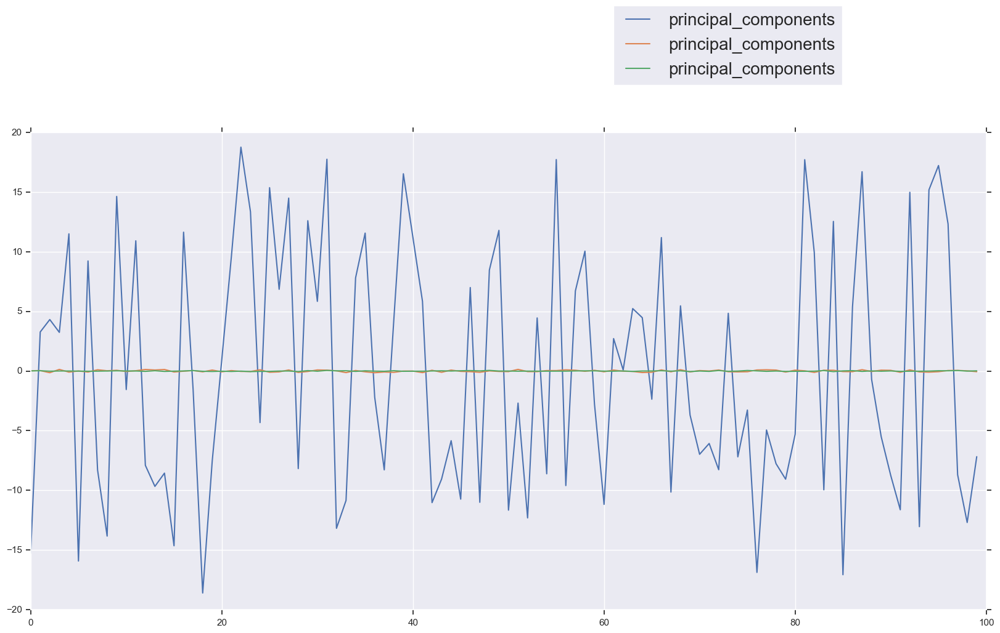

In [75]:
pca = PCA(n_components=3)
X = pd.DataFrame.from_records(states).T
principal_components = pca.fit_transform(X.T)

plt.rcParams["figure.figsize"] = (20,10)
plt.plot(range(0, 100, window2), principal_components, label = 'principal_components')
plt.legend(loc=(0.61,1.1), fontsize=20)

# Изучение "внутренностей" 

In [76]:
WOut = esn.GetOutputWeights()
WOut.shape

(1, 101)

In [77]:
W = esn.GetReservoirMatrix()
print(W.shape)
W

(100, 100)


array([[ 0.        ,  0.        ,  0.        , ...,  0.16421958,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.18669715],
       ...,
       [ 0.        ,  0.        ,  0.        , ..., -0.14585207,
         0.        , -0.15668924],
       [ 0.        ,  0.        , -0.15901152, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.10908885,  0.        ]])

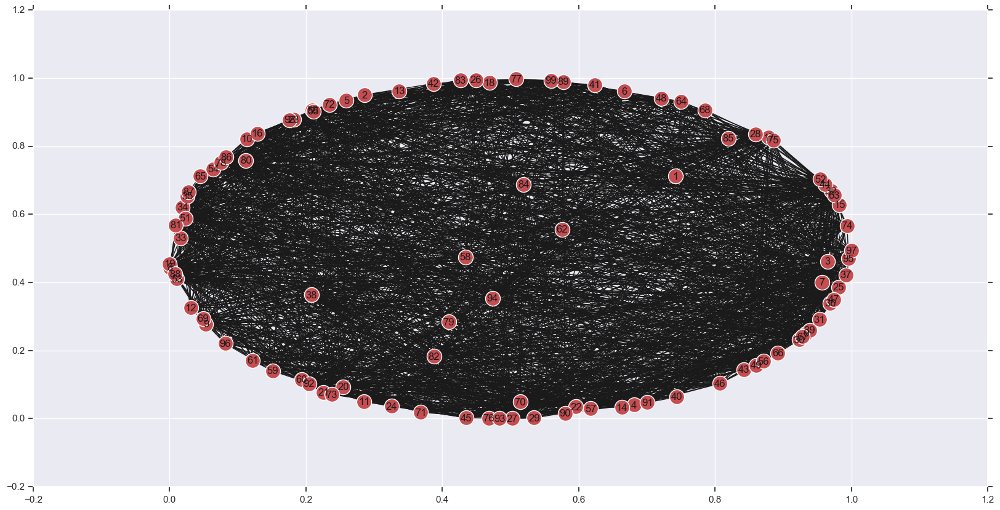

In [78]:
graph = nx.graph.Graph(W)
nx.draw_networkx(graph)

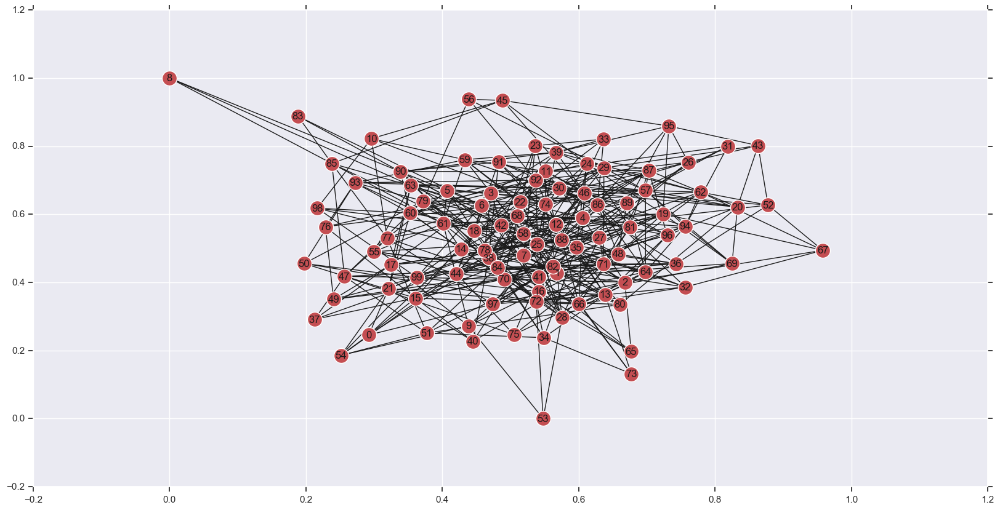

In [79]:
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

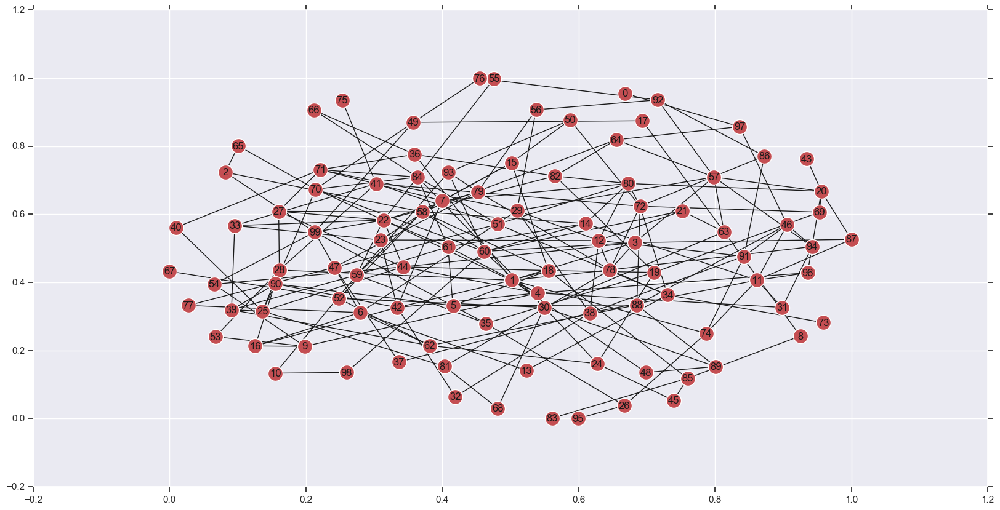

In [80]:
has_edge= W>0.15
graph = nx.graph.Graph(has_edge)
nx.draw_networkx(graph)

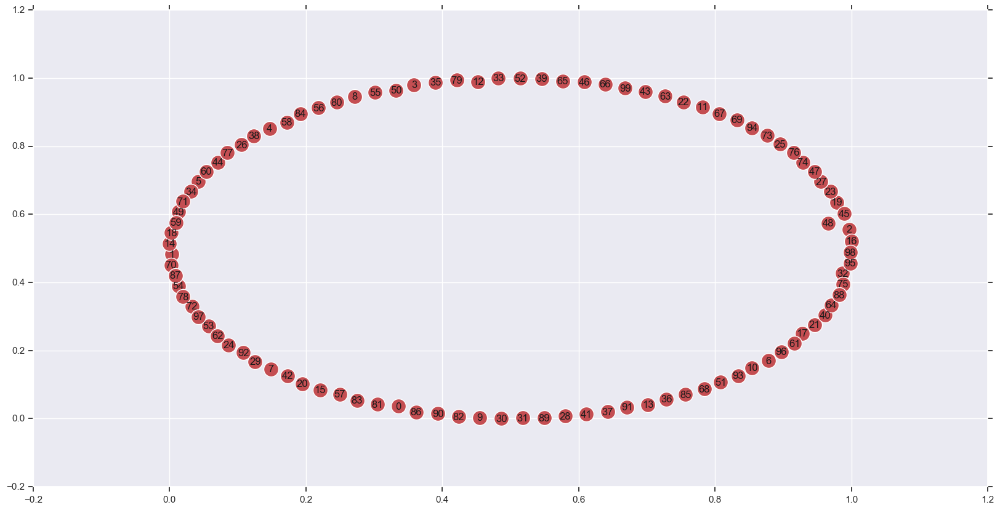

In [81]:
graph = nx.graph.Graph(W>0.20)
nx.draw_networkx(graph)

#  weightGeneration & spectralRadius
weightGeneration = 'naive'

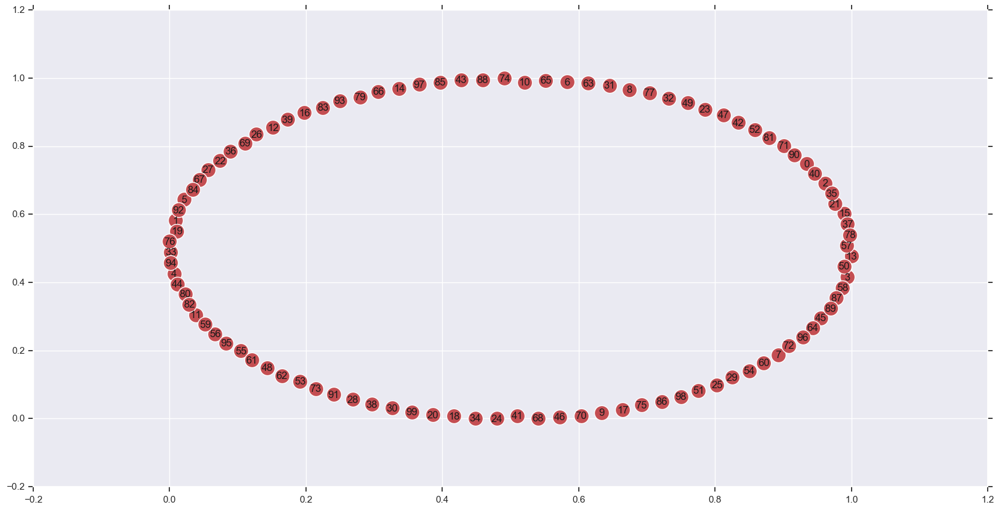

In [82]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.1, leakingRate=0.55,
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

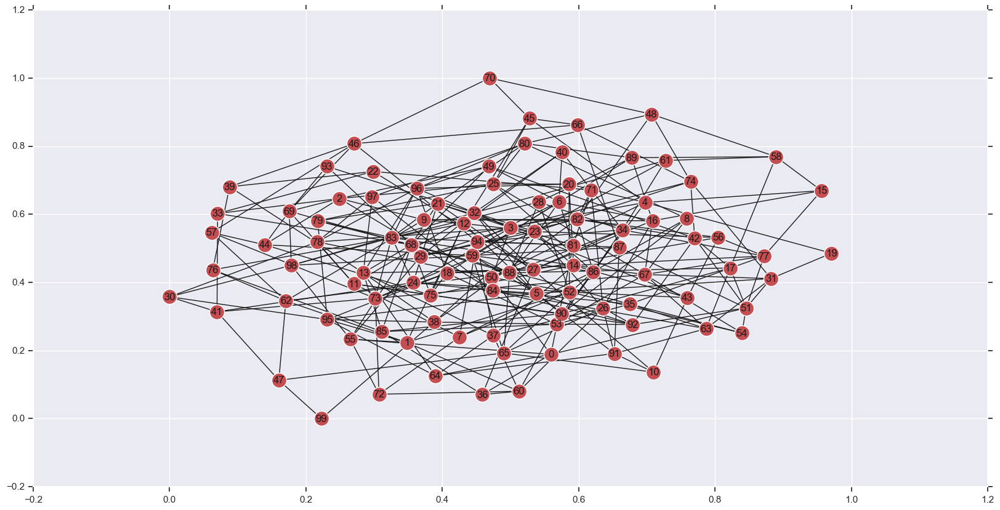

In [83]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.4, leakingRate=0.55, 
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

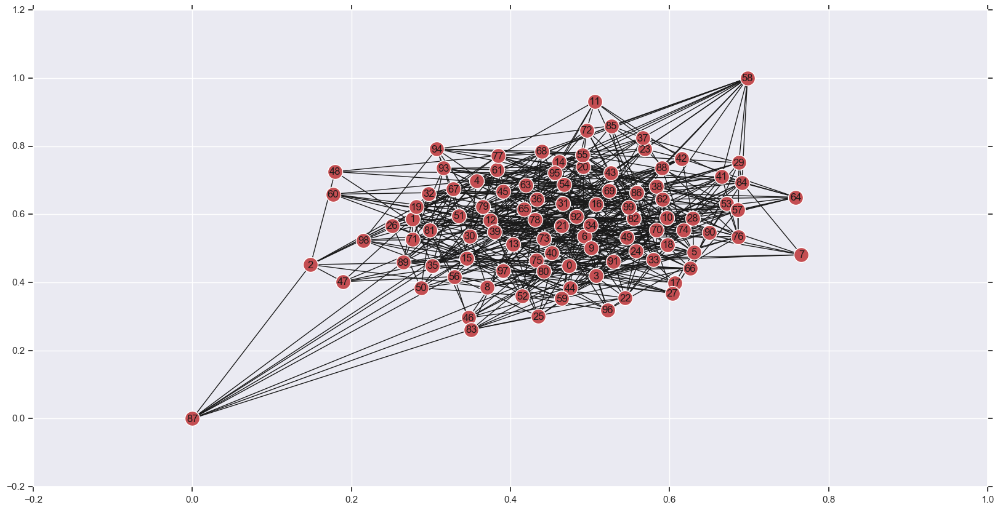

In [84]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.7, leakingRate=0.55, 
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

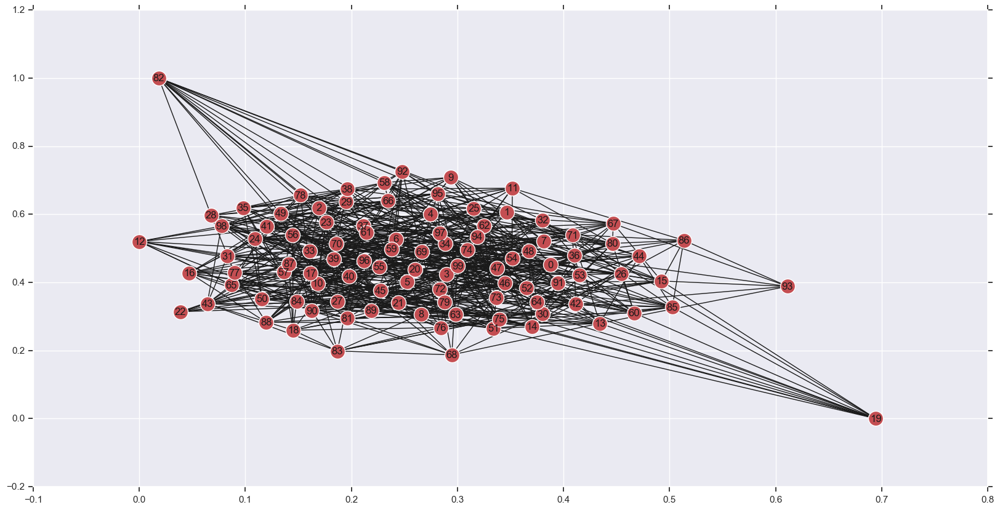

In [85]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=1.0, leakingRate=0.55, 
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

## weightGeneration = 'SORM'

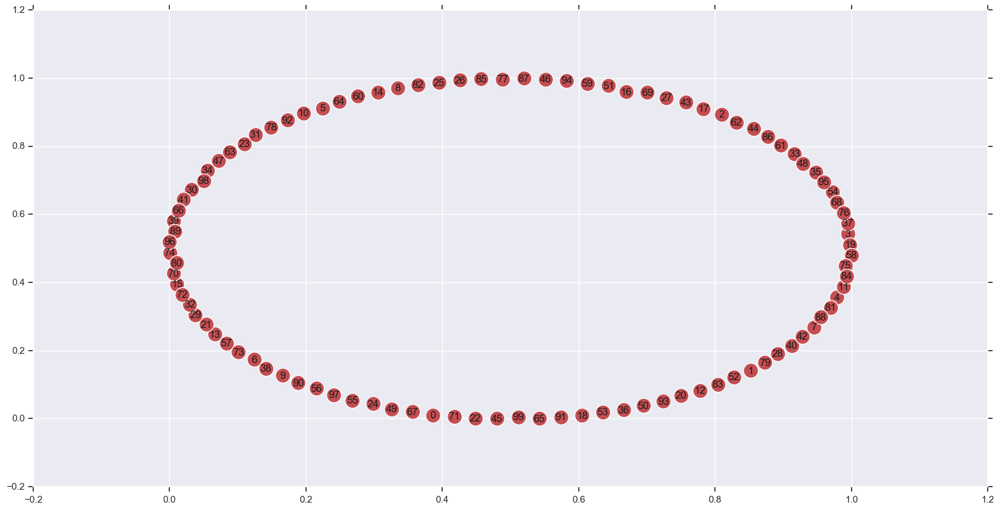

In [86]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.1, leakingRate=0.55, weightGeneration = 'SORM',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

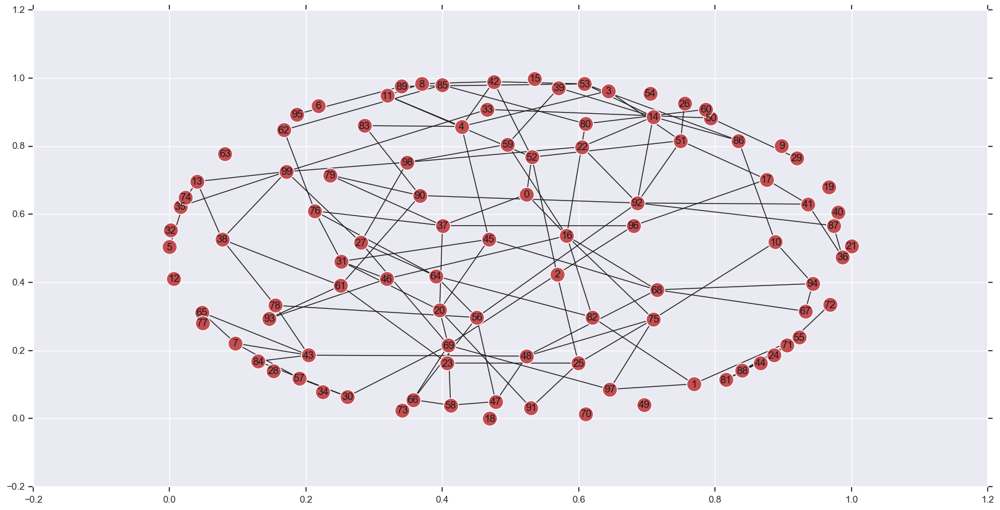

In [87]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.4, leakingRate=0.55, weightGeneration = 'SORM',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

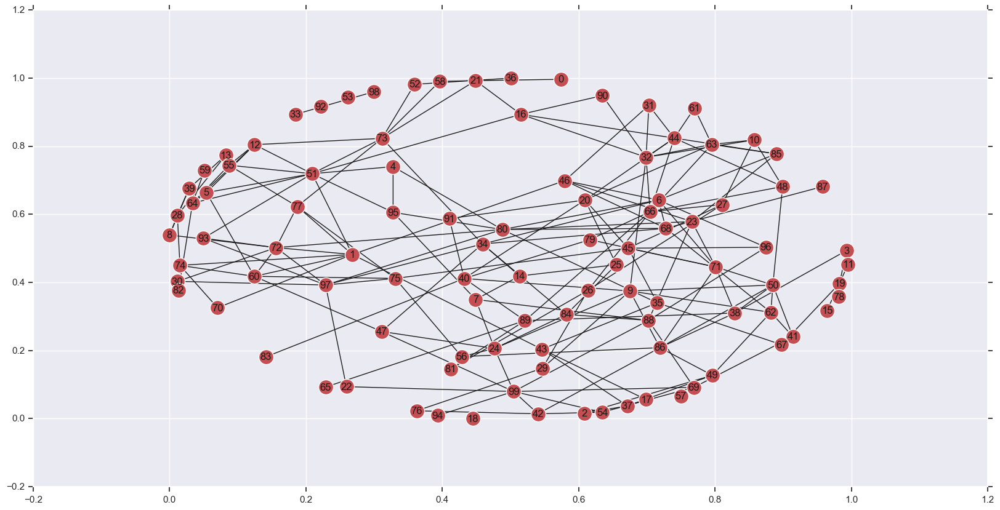

In [88]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.7, leakingRate=0.55, weightGeneration = 'SORM',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

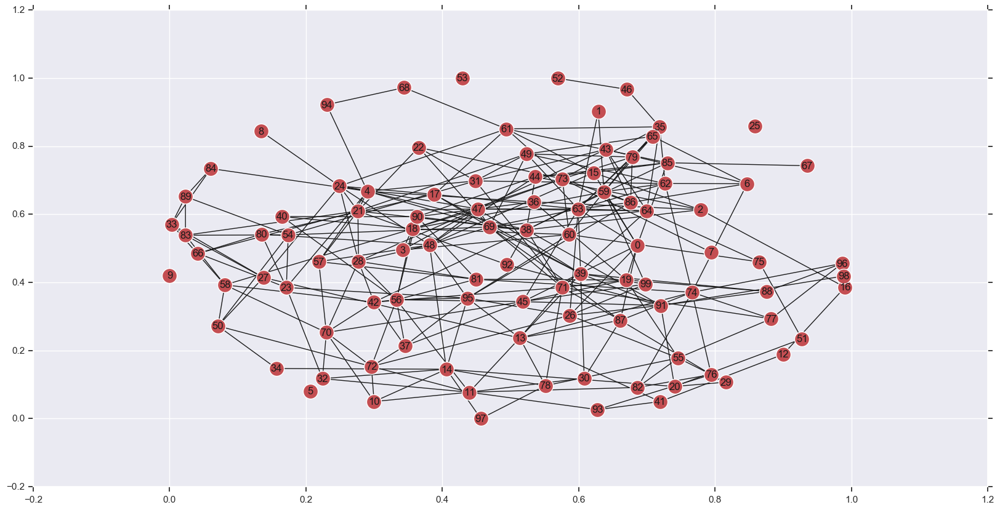

In [89]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=1.0, leakingRate=0.55, weightGeneration = 'SORM',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

##  weightGeneration = 'advanced'
random weight matrix from 0 to 0.5

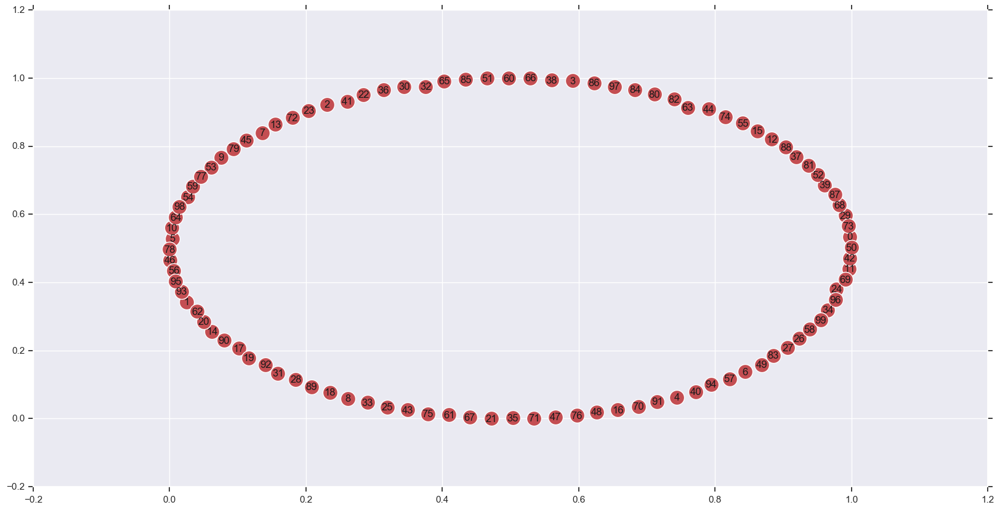

In [90]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.1, leakingRate=0.55, weightGeneration = 'advanced',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

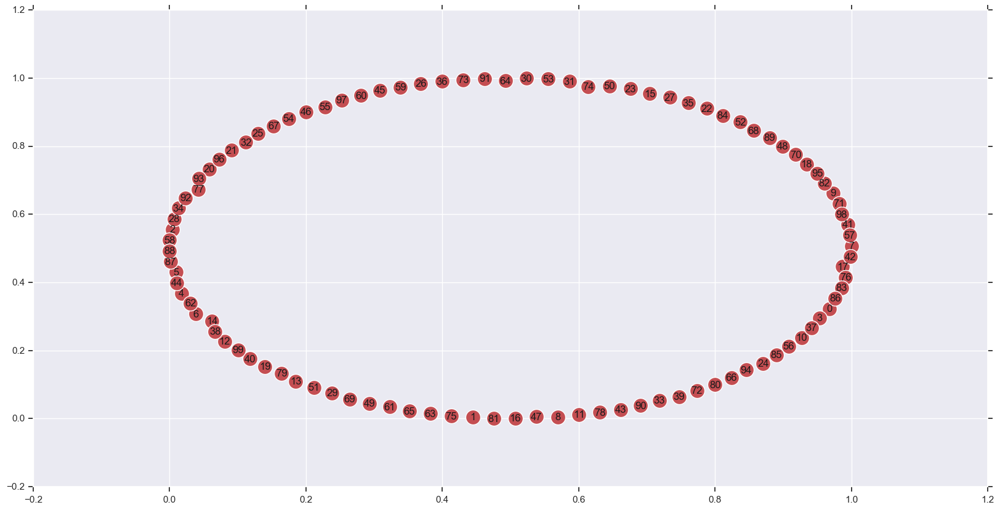

In [91]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.4, leakingRate=0.55, weightGeneration = 'advanced',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

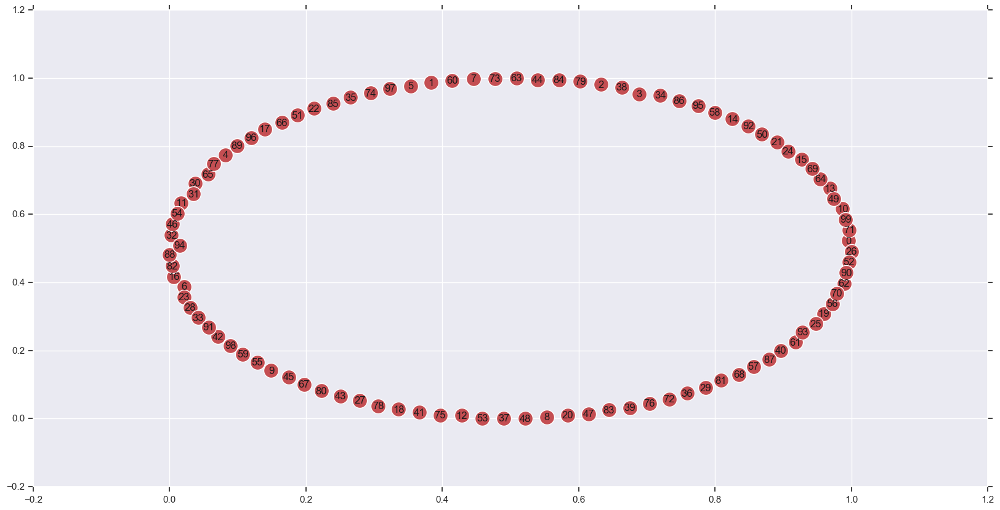

In [92]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=0.7, leakingRate=0.55, weightGeneration = 'advanced',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

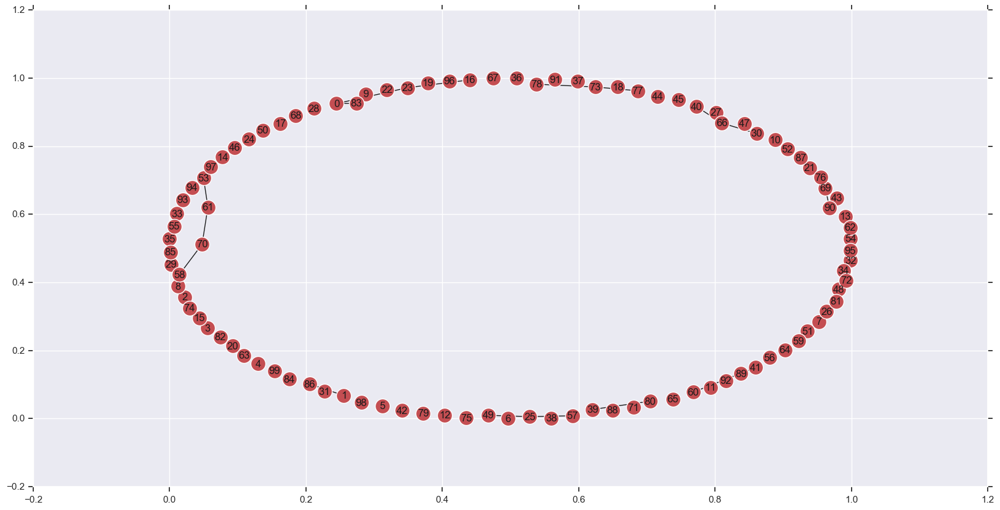

In [93]:
esn = PredictionESN(n_input=0, n_output=3, n_reservoir=100, spectralRadius=1.0, leakingRate=0.55, weightGeneration = 'advanced',
                    regressionParameters=[1e-5], solver = 'lsqr', feedback=True)
W = esn.GetReservoirMatrix()
graph = nx.graph.Graph(W>0.10)
nx.draw_networkx(graph)

# PCA  (сравнение главных компонент при различных размерах резервуара

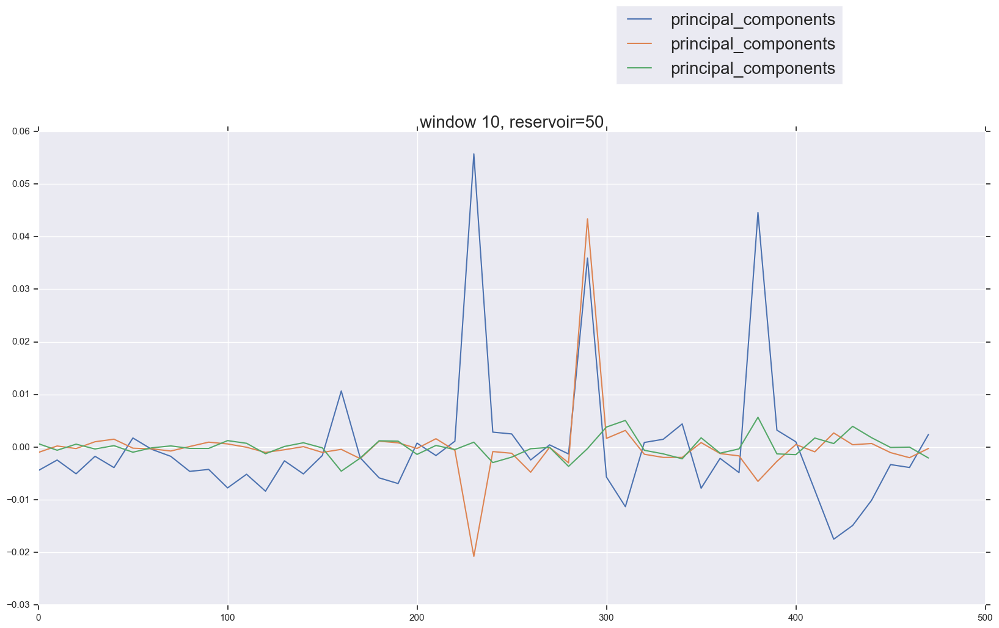

In [94]:
esn = PredictionESN(n_input=0, n_output=1, n_reservoir=50, spectralRadius=0.71, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
y1 = []
y2 = []
states = []
window = 40
window2 = 10
for i1 in range(0, len(MSFT)-700, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[j1:j2]
    
    esn.fit(None, OutputDataTrain, transientTime=5, verbose=0)
    states.append(esn.GetState())
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
    y1.append(OutputDataTest.values)
    y2.extend(one_step_prediction.tolist())
y1 = [yy for y in y1 for yy in y]
y2 = [yy for y in y2 for yy in y]
x = range(len(y1))

pca = PCA(n_components=3)
X = pd.DataFrame.from_records(states).T
principal_components = pca.fit_transform(X.T)

plt.title('window 10, reservoir=50', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(range(0, len(MSFT)-700, window2), principal_components, label = 'principal_components')
plt.legend(loc=(0.61,1.1), fontsize=20)

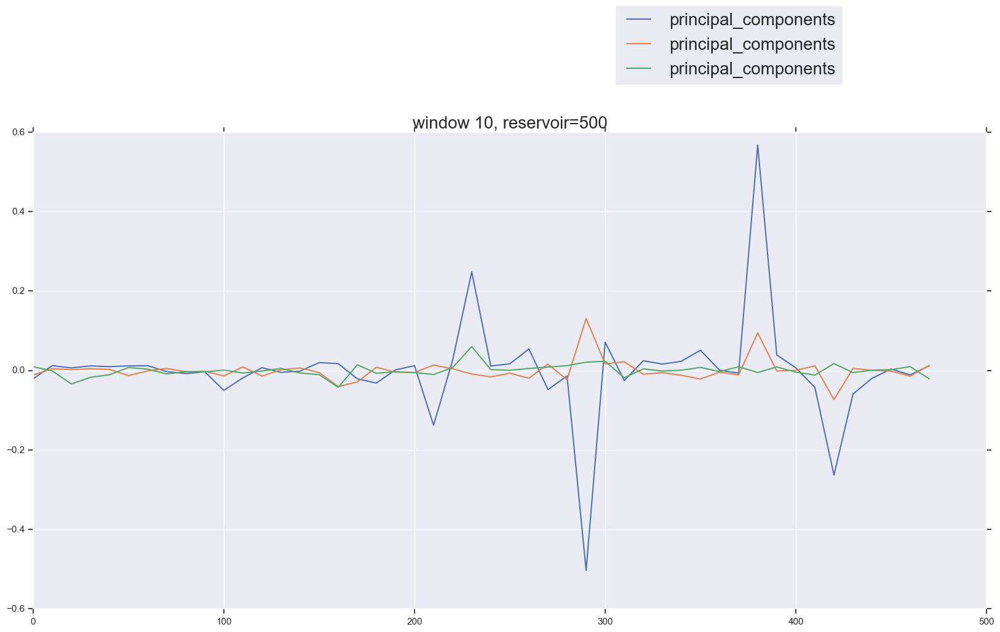

In [95]:
esn = PredictionESN(n_input=0, n_output=1, n_reservoir=500, spectralRadius=0.71, leakingRate=0.95, regressionParameters=[1e-5], solver="lsqr", feedback=True)
y1 = []
y2 = []
states = []
window = 40
window2 = 10
for i1 in range(0, len(MSFT)-700, window2):
    i2 = i1 + window
    j1 = i2
    j2 = j1 + window2
    InputDataTrain = np.ones(window)
    OutputDataTrain = MSFT[i1:i2]
    InputDataTest = np.ones(window2)
    OutputDataTest = MSFT[j1:j2]
    
    esn.fit(None, OutputDataTrain, transientTime=5, verbose=0)
    states.append(esn.GetState())
    one_step_prediction = esn.generate(n=window2, inputData=None, initialOutputData=OutputDataTrain.iloc[-1])
    y1.append(OutputDataTest.values)
    y2.extend(one_step_prediction.tolist())
y1 = [yy for y in y1 for yy in y]
y2 = [yy for y in y2 for yy in y]
x = range(len(y1))

pca = PCA(n_components=3)
X = pd.DataFrame.from_records(states).T
principal_components_n500 = pca.fit_transform(X.T)

plt.title('window 10, reservoir=500', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(range(0, len(MSFT)-700, window2), principal_components_n500, label = 'principal_components')
plt.legend(loc=(0.61,1.1), fontsize=20)

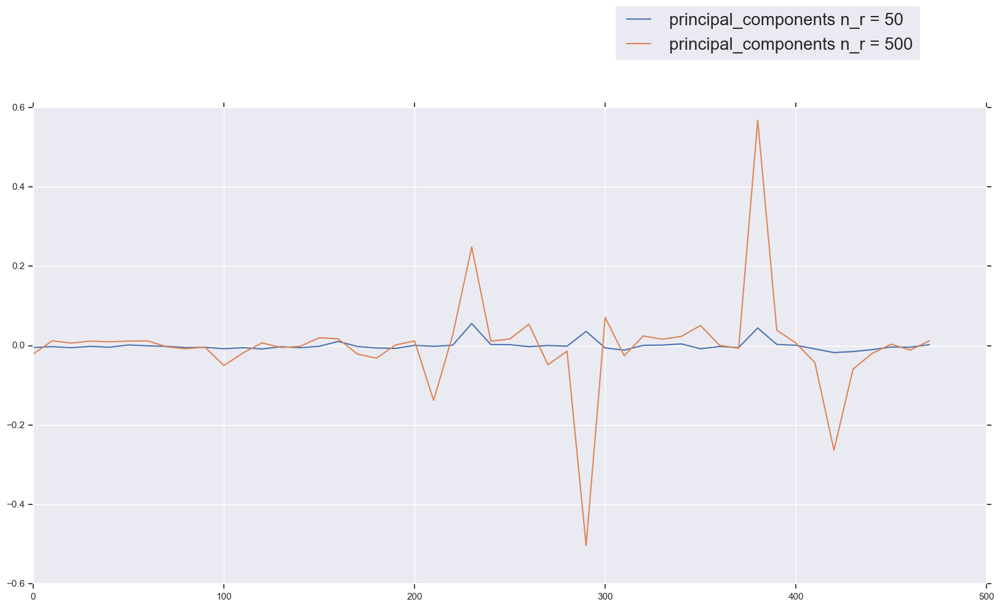

In [96]:
principal_components = pd.DataFrame.from_records(principal_components)
principal_components_n500 = pd.DataFrame.from_records(principal_components_n500)

plt.rcParams["figure.figsize"] = (20,10)
plt.plot(range(0, len(MSFT)-700, window2), principal_components[0], label = 'principal_components n_r = 50')
plt.plot(range(0, len(MSFT)-700, window2), principal_components_n500[0], label = 'principal_components n_r = 500')
plt.legend(loc=(0.61,1.1), fontsize=20)

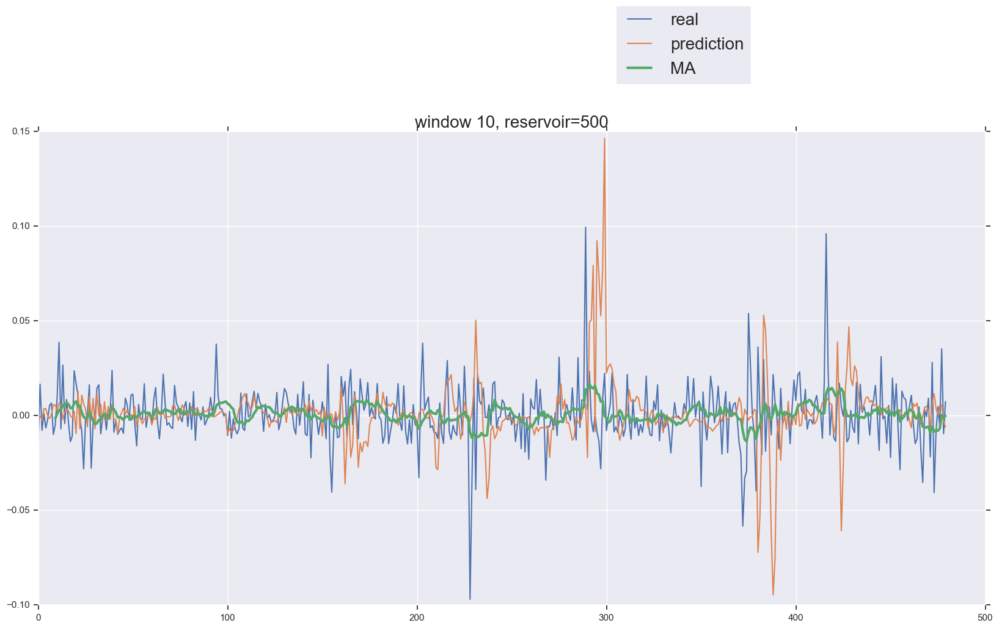

In [97]:
y3 = MSFT.iloc[window:-(696-window)].rolling(window=10, min_periods=10).mean()
plt.title('window 10, reservoir=500', fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction')
plt.plot(x, y3, label = 'MA', lw=3)
plt.legend(loc=(0.61,1.1), fontsize=20)

# Главная ф-я

In [40]:
def predict_esn(data, window = 150, r_size = 100, spectral_rad = 0.5, leaking_rate = 0.55, \
    lag = 750, reg_param = 5e-4, res_density = 0.15):
    mape = []
    medape = []
    dev = []
    InputDataTrain = data[len(data)-lag-1:-window-1]
    OutputDataTrain = data[len(data)-lag:-window]
    OutputDataTest = data[-window:]
    for i in range (0,100):
        esn = PredictionESN(n_input=1, n_output=1, noiseLevel=np.std(OutputDataTrain),  n_reservoir=r_size, spectralRadius=spectral_rad,\
                            reservoirDensity=res_density,  leakingRate=leaking_rate, regressionParameters=[reg_param], solver="lsqr",\
                            weightGeneration='advanced', feedback=False)
        y1 = OutputDataTest.values
        y2 = []
        current_input = OutputDataTrain.iloc[-1]
        one_step_prediction=current_input
        esn.fit(InputDataTrain, OutputDataTrain, transientTime=50, verbose=0)
        for x in OutputDataTest:
            one_step_prediction = esn.predict([current_input])
            #print(current_input, one_step_prediction)
            y2.extend(one_step_prediction.tolist()[0])
            current_input=one_step_prediction
        y_predict = np.array(y2)
        y_real = np.array(y1)
        mape.append(np.mean(abs((y_real - y_predict)/y_real)))
        medape.append(np.median(abs((y_real - y_predict)/y_real)))
        dev.append(np.mean(abs(y_real - y_predict)))
        del esn
    return np.mean(mape), np.mean(medape), np.mean(dev)

MAPE: 0.044054550804374475
MEDAPE: 0.04537836844710336
DEV: 53.473334820978216


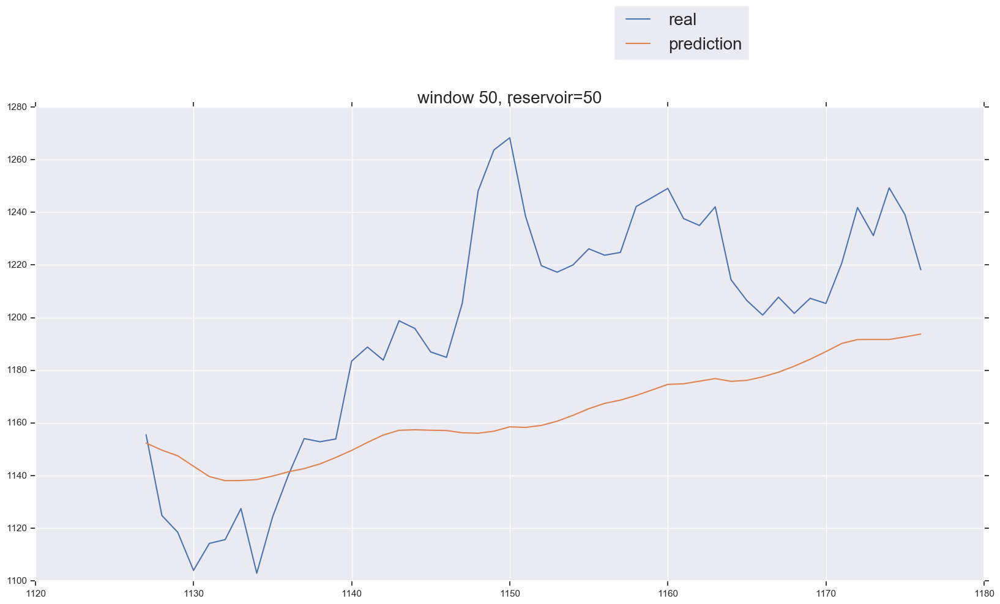

In [39]:
data_raw = prices_df['GOOG']
data = data_raw
m = data_raw.min()
M = data_raw.max()
data = data.apply(lambda x: 2*(x - m)/(M - m) - 1)
mape = []
medape = []
dev = []
window = 50
window2 = 20
r_size = 50
InputDataTrain = data[len(data)-701:-window-1]
OutputDataTrain = data[len(data)-700:-window]
InputDataTest = np.ones(window2)
OutputDataTest = data_raw[-window:]
for i in range (0,100):
    esn = PredictionESN(n_input=1, n_output=1, noiseLevel=np.std(OutputDataTrain)*3,  n_reservoir=r_size, spectralRadius=0.9,\
                        reservoirDensity=0.2,  leakingRate=0.1, regressionParameters=[5e-1], solver="lsqr",\
                        weightGeneration='advanced', feedback=False)
    y1 = []
    y2 = []
    current_input = OutputDataTrain.iloc[-1]
    one_step_prediction=current_input
    esn.fit(InputDataTrain, OutputDataTrain, transientTime=50, verbose=0)
    for x in OutputDataTest:
        one_step_prediction = esn.predict([current_input])
        #print(current_input, one_step_prediction)
        val = (one_step_prediction.tolist()[0][0]+ 1)*(M - m)/2 + m
        y2.append(val)
        current_input=one_step_prediction
    y1.extend(OutputDataTest.values)
    y_predict = np.array(y2)
    y_real = np.array(y1)
    mape.append(np.mean(abs((y_real - y_predict)/y_real)))
    medape.append(np.median(abs((y_real - y_predict)/y_real)))
    dev.append(np.mean(abs(y_real - y_predict)))
print("MAPE:", np.mean(mape))
print("MEDAPE:", np.mean(medape))
print("DEV:", np.mean(dev))
x=list(range(len(data)-window, len(data)))
plt.title('window {0}, reservoir={1}'.format(window, r_size), fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction')
plt.legend(loc=(0.61,1.1), fontsize=20)

In [290]:
m = data.min()
M = data.max()
data = MSFT_pr.apply(lambda x: 2*(x - m)/(M - m) - 1)

Wall time: 0 ns
MAPE: 0.13373404451884444
MEDAPE: 0.13542107871168402
DEV: 8.739068902442424


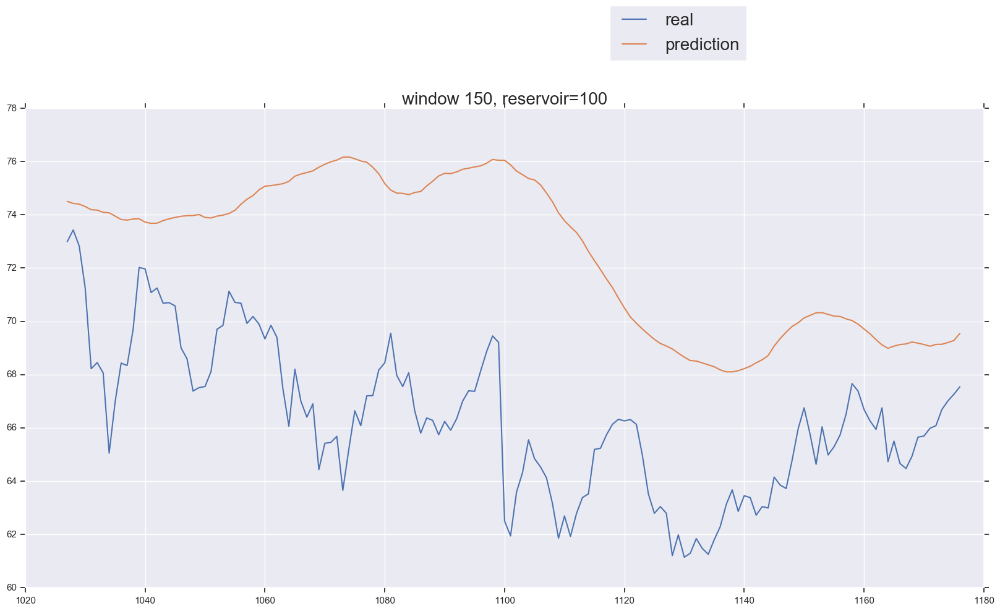

In [185]:
data = prices_df['A']
mape = []
medape = []
dev = []
window = 150
window2 = 20
r_size = 100
lag = 150 + 600
InputDataTrain = data[len(data)-lag-1:-window-1]
OutputDataTrain = data[len(data)-lag:-window]
InputDataTest = np.ones(window2)
OutputDataTest = data[-window:]
for i in range (0,100):
    esn = PredictionESN(n_input=1, n_output=1, noiseLevel=np.std(OutputDataTrain),  n_reservoir=r_size, spectralRadius=0.5,\
                        reservoirDensity=0.15,  leakingRate=0.1, regressionParameters=[5e-4], solver="lsqr",\
                        weightGeneration='advanced', feedback=False)
    y1 = OutputDataTest.values
    y2 = []
    current_input = OutputDataTrain.iloc[-1]
    one_step_prediction=current_input
    esn.fit(InputDataTrain, OutputDataTrain, transientTime=50, verbose=0)
    for x in OutputDataTest:
        one_step_prediction = esn.predict([current_input])
        #print(current_input, one_step_prediction)
        y2.extend(one_step_prediction.tolist()[0])
        current_input=one_step_prediction
    y_predict = np.array(y2)
    y_real = np.array(y1)
    mape.append(np.mean(abs((y_real - y_predict)/y_real)))
    medape.append(np.median(abs((y_real - y_predict)/y_real)))
    dev.append(np.mean(abs(y_real - y_predict)))
    del esn
%time
print("MAPE:", np.mean(mape))
print("MEDAPE:", np.mean(medape))
print("DEV:", np.mean(dev))
x=list(range(len(data)-window, len(data)))
plt.title('window {0}, reservoir={1}'.format(window, r_size), fontsize=20)
plt.rcParams["figure.figsize"] = (20,10)
plt.plot(x, y1, label='real')
plt.plot( x, y2, label='prediction')
plt.legend(loc=(0.61,1.1), fontsize=20)

In [119]:
errors_prices = pd.read_csv('errors_prices150.csv', names = ['mape', 'medape', 'dev'], header = 0)
errors_returns = pd.read_csv('errors_returns150.csv', names = ['mape', 'medape', 'dev'], header = 0)

In [46]:
columns = ['MSFT', 'AAPL', 'IBM', 'GOOG', 'AMZN', 'F', 'GE']
#columns = prices_df.columns

In [48]:
#for prices
errors_prices = pd.DataFrame([], columns = ['mape', 'medape', 'dev'])
for name in columns:
    errors_prices.loc[len(errors_prices)] = predict_esn(prices_df[name])
errors_prices.index = columns

#for returns
errors_returns = pd.DataFrame([], columns = ['mape', 'medape', 'dev'])
for name in columns:
    errors_returns.loc[len(errors_returns)] = predict_esn(returns_df[name])
errors_returns.index = columns

In [49]:
errors_returns.head()

,mape,medape,dev
MSFT,inf,0.975332,0.011608
AAPL,1.130620,0.991345,0.010719
IBM,1.038320,1.002380,0.009508
GOOG,1.168952,0.991024,0.012514
AMZN,1.238655,0.956908,0.012441


In [50]:
errors_prices.head()

,mape,medape,dev
MSFT,0.166502,0.160537,16.802352
AAPL,0.069099,0.063670,13.358969
IBM,0.101742,0.109305,14.886199
GOOG,0.225659,0.245063,253.420702
AMZN,0.216733,0.224265,372.138726


# Распределения ошибок

In [117]:
def hist_err(data, title):
    fig = plt.figure(figsize=(16,8))
    plt.hist(data, bins = np.arange(min(data),max(data),(max(data) - min(data))/25), color='#00008B')
    plt.title(title, fontsize=20)
    plt.show()

In [124]:
def hist_err_price(data, title):
    fig = plt.figure(figsize=(16,8))
    plt.hist(data, bins = np.arange(0,1,0.05), color='#00008B')
    plt.title(title, fontsize=20)
    plt.show()

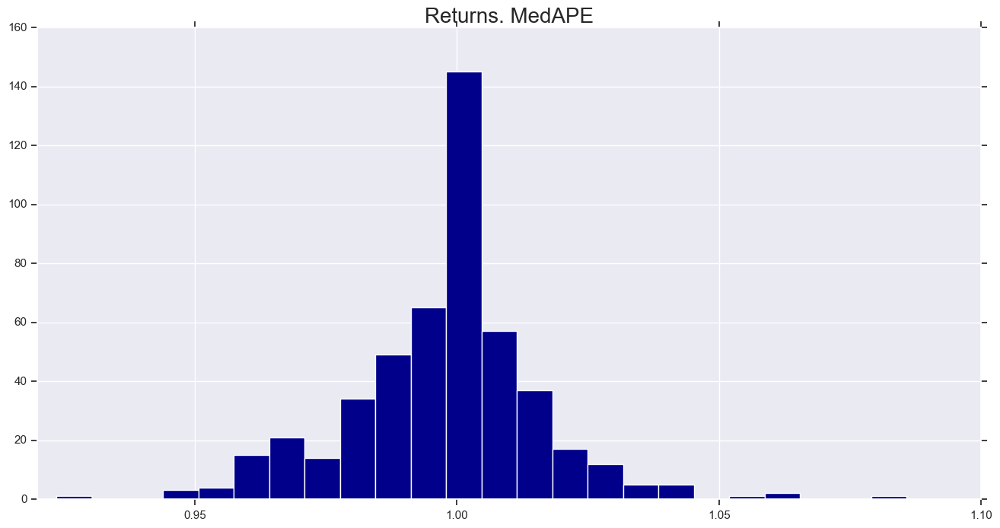

In [120]:
hist_err(errors_returns['medape'], 'Returns. MedAPE')

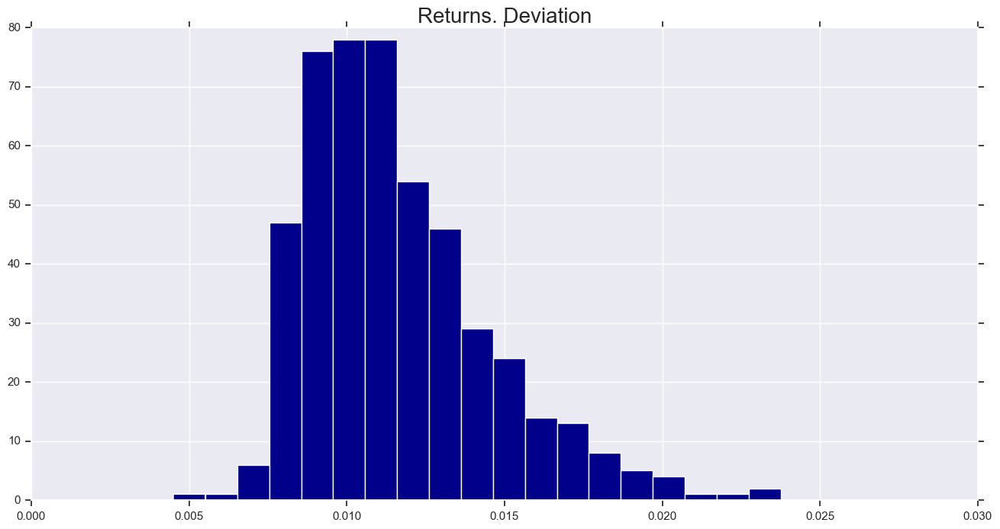

In [117]:
hist_err(errors_returns['dev'], 'Returns. Deviation')

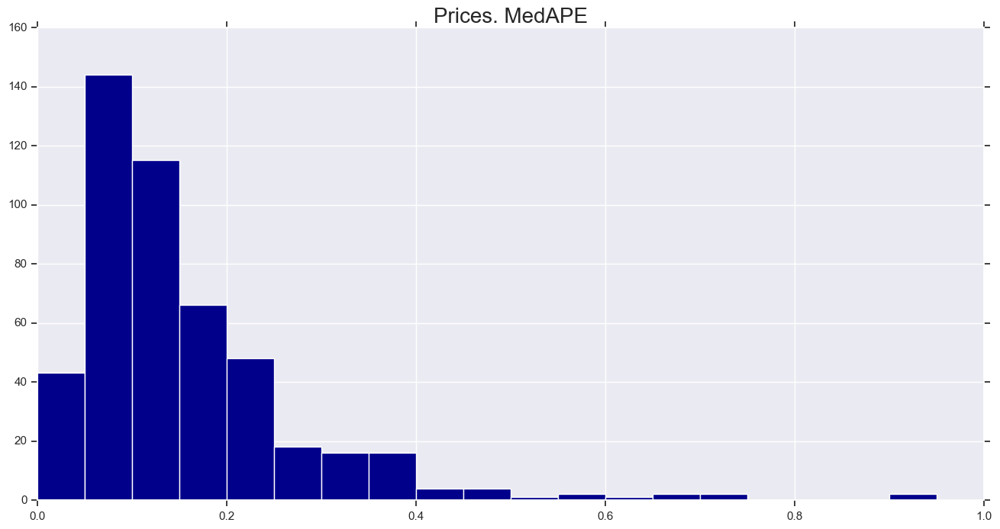

In [125]:
hist_err_price(errors_prices['medape'], 'Prices. MedAPE')

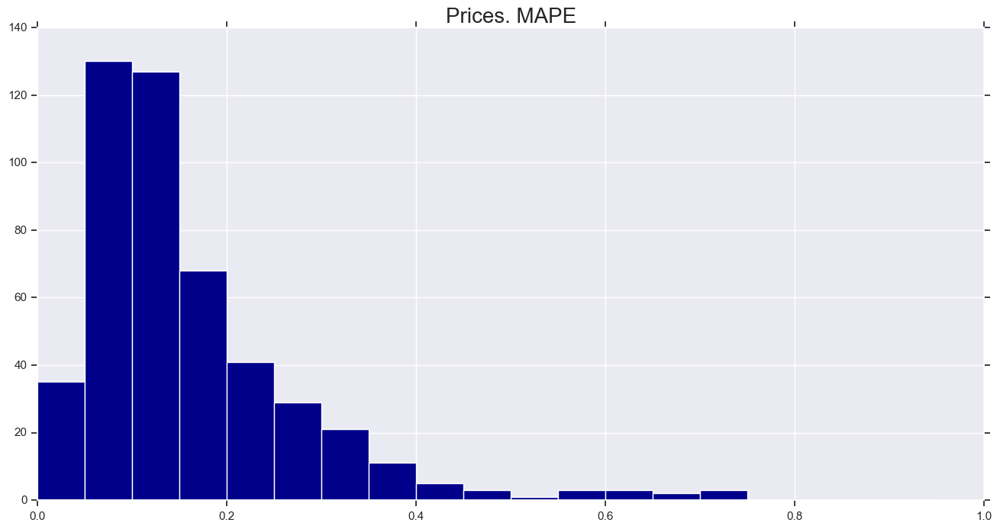

In [126]:
hist_err_price(errors_prices['mape'], 'Prices. MAPE')

In [122]:
errors_prices = pd.read_csv('errors_prices50.csv', names = ['mape', 'medape', 'dev'], header = 0)
errors_returns = pd.read_csv('errors_returns50.csv', names = ['mape', 'medape', 'dev'], header = 0)

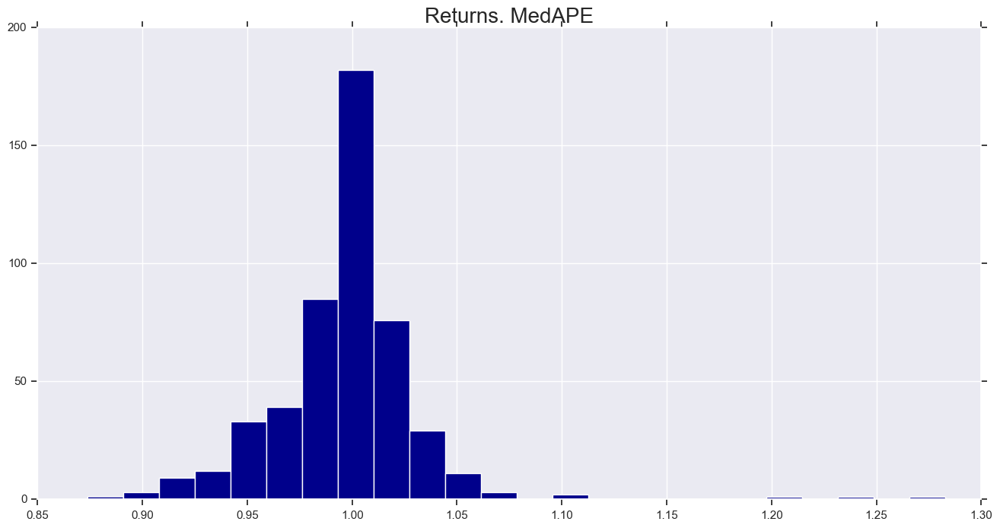

In [126]:
hist_err(errors_returns['medape'], 'Returns. MedAPE')

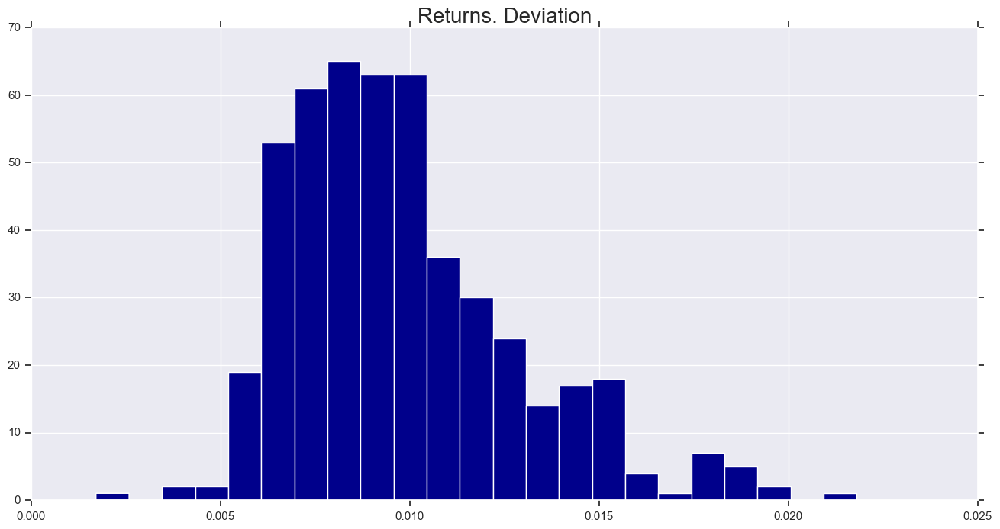

In [127]:
hist_err(errors_returns['dev'], 'Returns. Deviation')

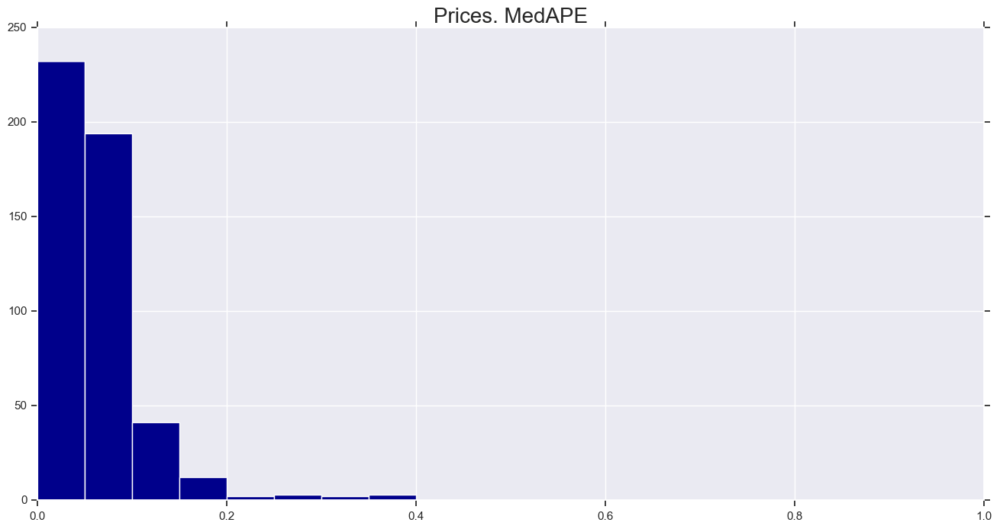

In [123]:
hist_err(errors_prices['medape'], 'Prices. MedAPE')

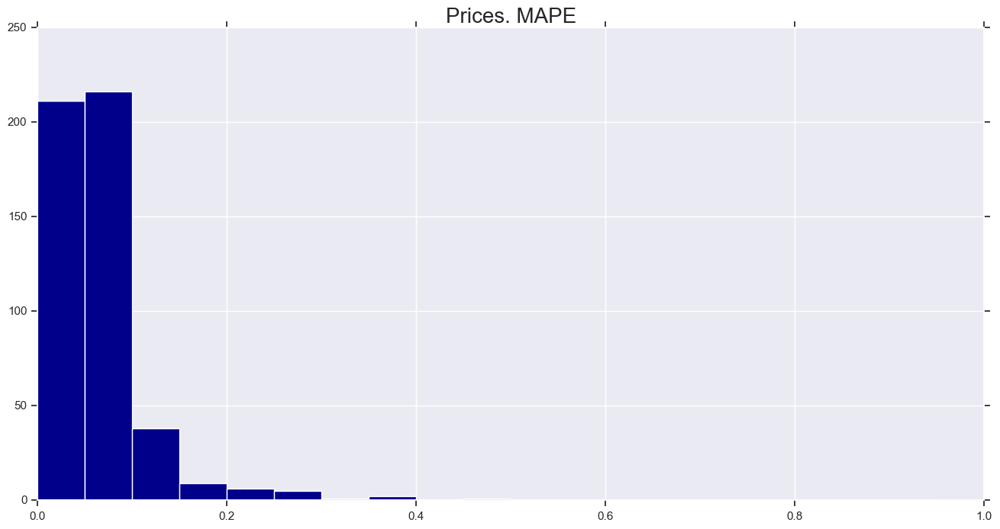

In [124]:
hist_err(errors_prices['mape'], 'Prices. MAPE')

# Масштабирование данных

In [184]:
def predict_esn_scaled(data_raw, window = 150, r_size = 50, spectral_rad = 0.9, leaking_rate = 0.1, \
    lag = 750, reg_param = 5e-1, res_density = 0.15, plot = False, iterations=50):
    mape = []
    medape = []
    dev = []
    data = data_raw
    m = data_raw.min()
    M = data_raw.max()
    data = data.apply(lambda x: 2*(x - m)/(M - m) - 1)
    InputDataTrain = data[len(data)-lag-1:-window-1]
    OutputDataTrain = data[len(data)-lag:-window]
    OutputDataTest = data_raw[-window:]
    for i in range (0,iterations):
        esn = PredictionESN(n_input=1, n_output=1, noiseLevel=np.std(OutputDataTrain)*3,  n_reservoir=r_size, spectralRadius=spectral_rad,\
                            reservoirDensity=res_density,  leakingRate=leaking_rate, regressionParameters=[reg_param], solver="lsqr",\
                            weightGeneration='advanced', feedback=False)
        y1 = OutputDataTest.values
        y2 = []
        current_input = OutputDataTrain.iloc[-1]
        one_step_prediction=current_input
        esn.fit(InputDataTrain, OutputDataTrain, transientTime=50, verbose=0)
        for x in OutputDataTest:
            one_step_prediction = esn.predict([current_input])
            #print(current_input, one_step_prediction)
            val = (one_step_prediction.tolist()[0][0]+ 1)*(M - m)/2 + m
            y2.append(val)
            current_input=one_step_prediction
        y_predict = np.array(y2)
        y_real = np.array(y1)
        mape.append(np.mean(abs((y_real - y_predict)/y_real)))
        medape.append(np.median(abs((y_real - y_predict)/y_real)))
        dev.append(np.mean(abs(y_real - y_predict)))
        del esn
    if plot:
        print("MAPE:", np.mean(mape))
        print("MEDAPE:", np.mean(medape))
        print("DEV:", np.mean(dev))

        x=list(range(len(data)-window, len(data)))
        plt.title('window {0}, reservoir={1}'.format(window, r_size), fontsize=20)
        plt.rcParams["figure.figsize"] = (20,10)
        plt.plot(x, y1, label='real')
        plt.plot( x, y2, label='prediction')
        plt.legend(loc=(0.61,1.1), fontsize=20)
    return np.mean(mape), np.mean(medape), np.mean(dev)

In [127]:
columns = ['MSFT', 'AAPL', 'IBM', 'GOOG', 'AMZN', 'F', 'GE']
#columns = prices_df.columns

In [163]:
#for prices
errors_prices = pd.DataFrame([], columns = ['mape', 'medape', 'dev'])
for name in columns:
    errors_prices.loc[len(errors_prices)] = predict_esn_scaled(prices_df[name], spectral_rad=0.5, leaking_rate=0.2, window=150)
errors_prices.index = columns
print(errors_prices)

          mape    medape         dev
MSFT  0.074425  0.075315    7.281036
AAPL  0.050698  0.038879    9.512846
IBM   0.113149  0.124055   16.550073
GOOG  0.144317  0.142457  158.623560
AMZN  0.103282  0.115580  171.971609
F     0.089706  0.072387    0.935330
GE    0.169910  0.190195    2.318706


In [172]:
columns = prices_df.columns

In [174]:
#for prices
errors_prices = pd.DataFrame([], columns = ['mape', 'medape', 'dev'])
for name in tqdm.tqdm(columns):
    errors_prices.loc[len(errors_prices)] = predict_esn_scaled(prices_df[name], spectral_rad=0.5, leaking_rate=0.2, window=150)
errors_prices.index = columns

#for returns
errors_returns = pd.DataFrame([], columns = ['mape', 'medape', 'dev'])
for name in tqdm.tqdm(columns):
    errors_returns.loc[len(errors_returns)] = predict_esn_scaled(returns_df[name], spectral_rad=0.5, leaking_rate=0.2, window=150)
errors_returns.index = columns

100%|████████████████████████████████████████████████████████████████████████████████| 489/489 [26:03<00:00,  3.20s/it]


In [175]:
errors_prices.to_csv('errors_prices150_scaled.csv')
errors_returns.to_csv('errors_returns150_scaled.csv')

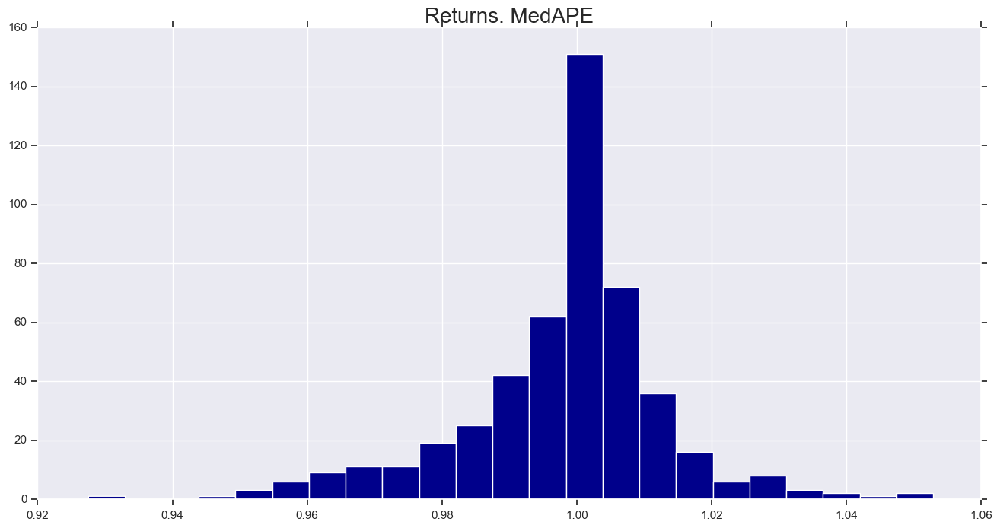

In [176]:
hist_err(errors_returns['medape'], 'Returns. MedAPE')

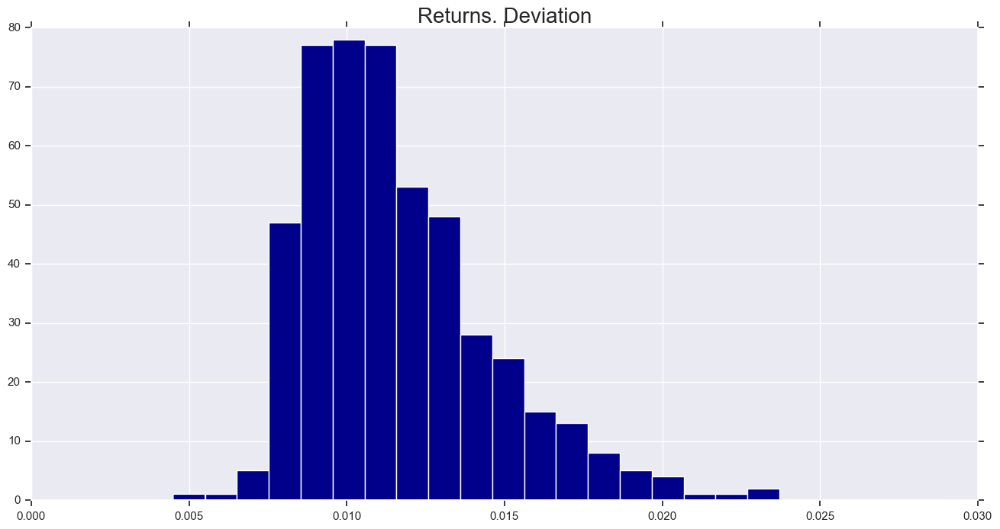

In [177]:
hist_err(errors_returns['dev'], 'Returns. Deviation')

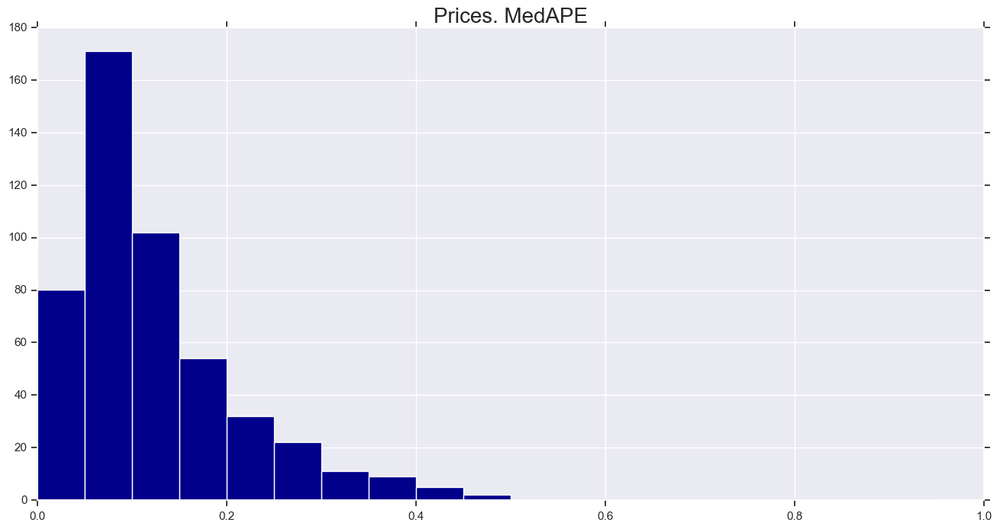

In [178]:
hist_err_price(errors_prices['medape'], 'Prices. MedAPE')

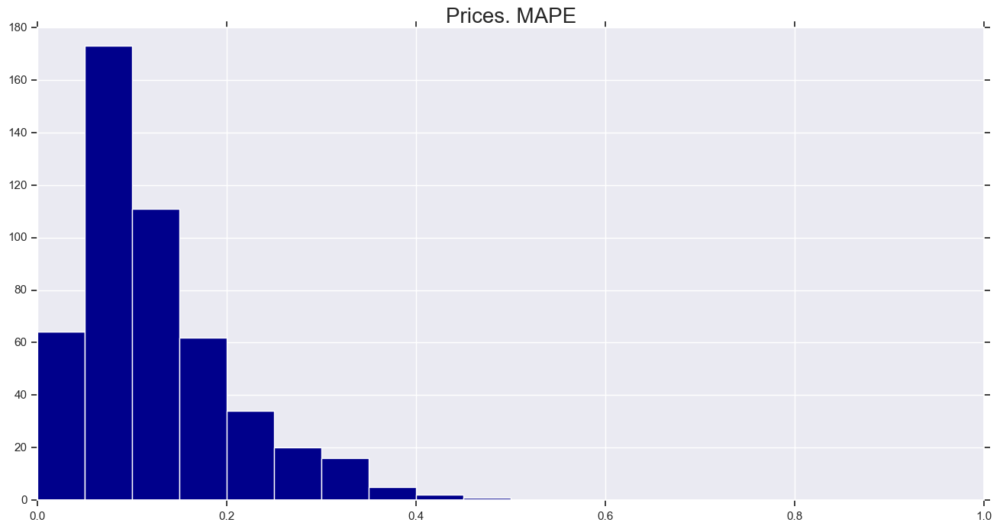

In [179]:
hist_err_price(errors_prices['mape'], 'Prices. MAPE')

In [180]:
#for prices
errors_prices = pd.DataFrame([], columns = ['mape', 'medape', 'dev'])
for name in columns:
    errors_prices.loc[len(errors_prices)] = predict_esn_scaled(prices_df[name], spectral_rad=0.5, leaking_rate=0.1, window=50)
errors_prices.index = columns

In [181]:
errors_prices.to_csv('errors_prices50_scaled.csv')

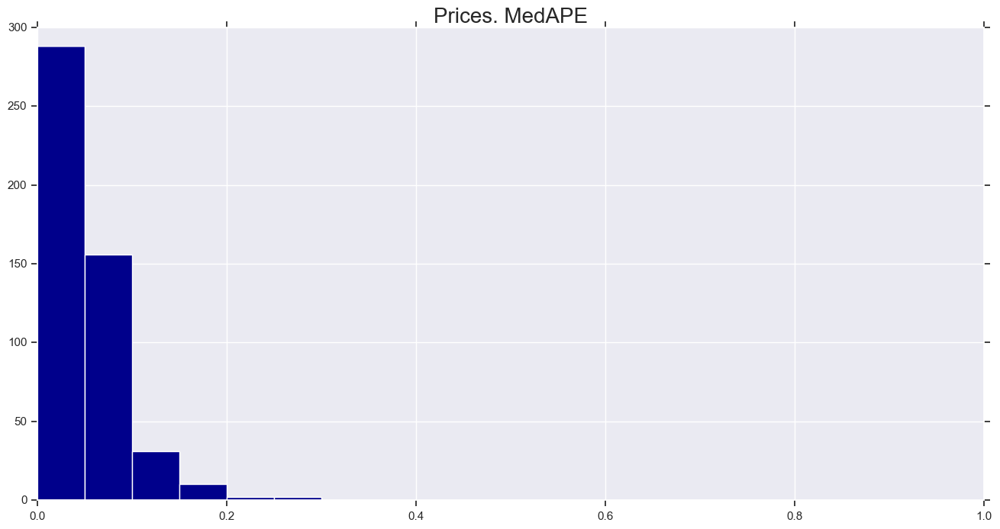

In [182]:
hist_err_price(errors_prices['medape'], 'Prices. MedAPE')

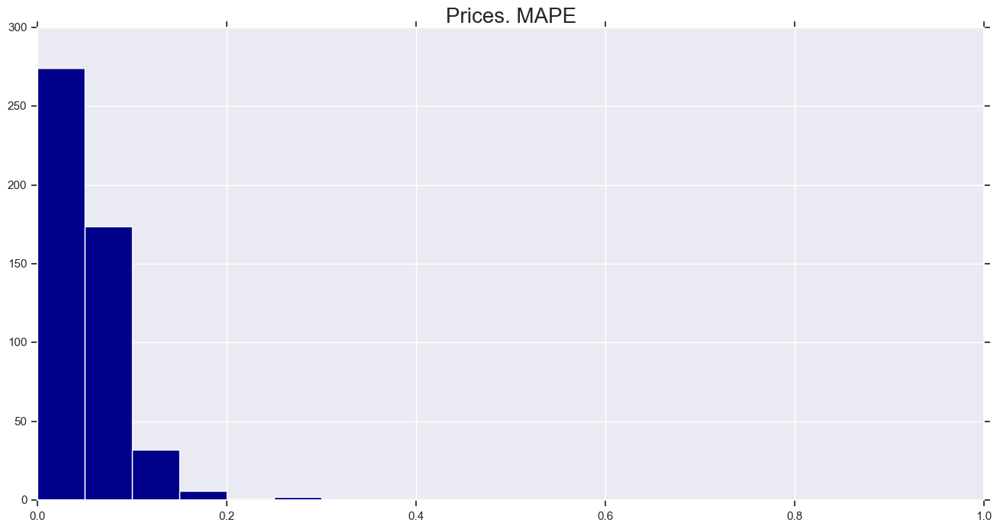

In [183]:
hist_err_price(errors_prices['mape'], 'Prices. MAPE')

# Значение параметров

## Leaking rate

Данный параметр отвечает за скорость обновления состояния резервуара. От этого сильно зависит стабильность работы системы. При слишком больших параметрах система слишком быстро меняет свое состояние, из-за чего может произойти разбалансировка. При малых значениях этого параметра изменения происходят медленно. Оптимальное значение параметра зависит от скорости изменений во временном ряду, а также от горизонта предсказаний (на сколь большой период нужно предсказать значения). Ниже можно видеть, как меняется стабильность системы при изменении leaking rate от 0.4 до 0.05

MAPE: 0.10388452953100867
MEDAPE: 0.10615920410550847
DEV: 122.24848294590718


(0.10388452953100867, 0.10615920410550847, 122.24848294590718)

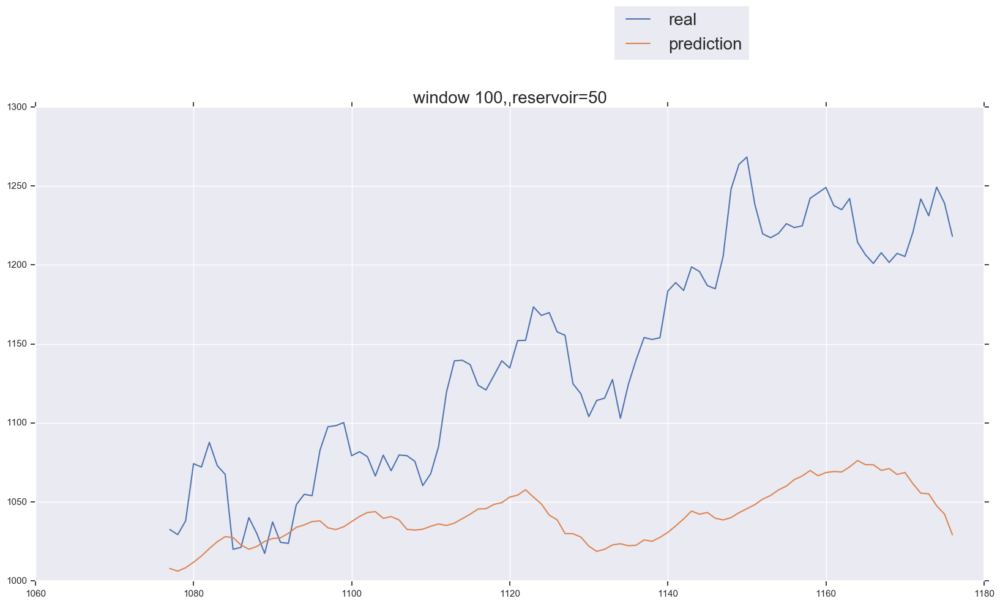

In [193]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.15, leaking_rate = 0.4, window = 100, plot=True)

MAPE: 0.10364325545474991
MEDAPE: 0.10560621418075317
DEV: 122.28759775859893


(0.10364325545474991, 0.10560621418075317, 122.28759775859893)

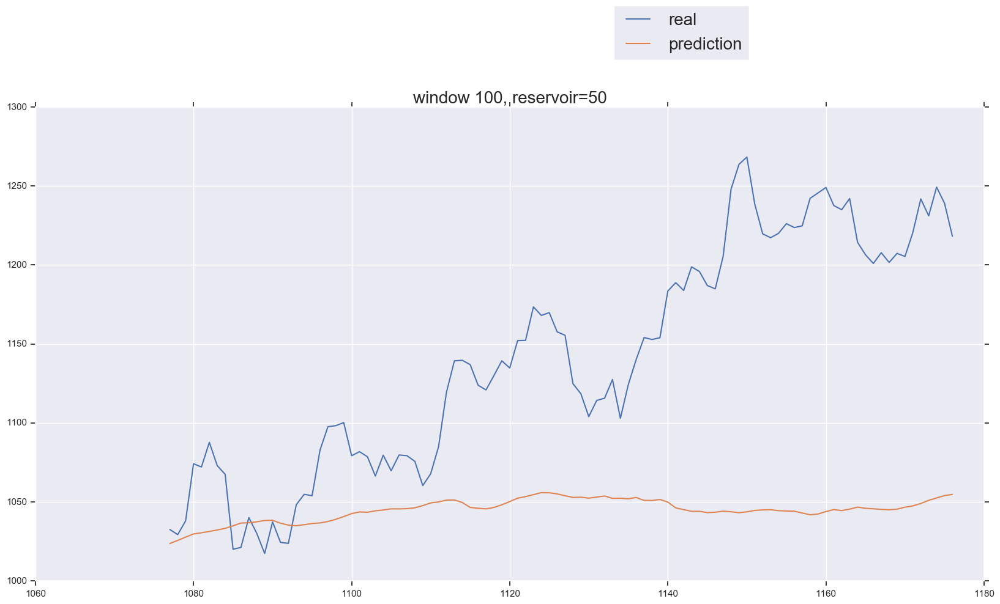

In [167]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.15, leaking_rate = 0.2, window = 100, plot=True)

MAPE: 0.06052241156981274
MEDAPE: 0.056536409378129156
DEV: 71.76185257062865


(0.06052241156981274, 0.056536409378129156, 71.76185257062865)

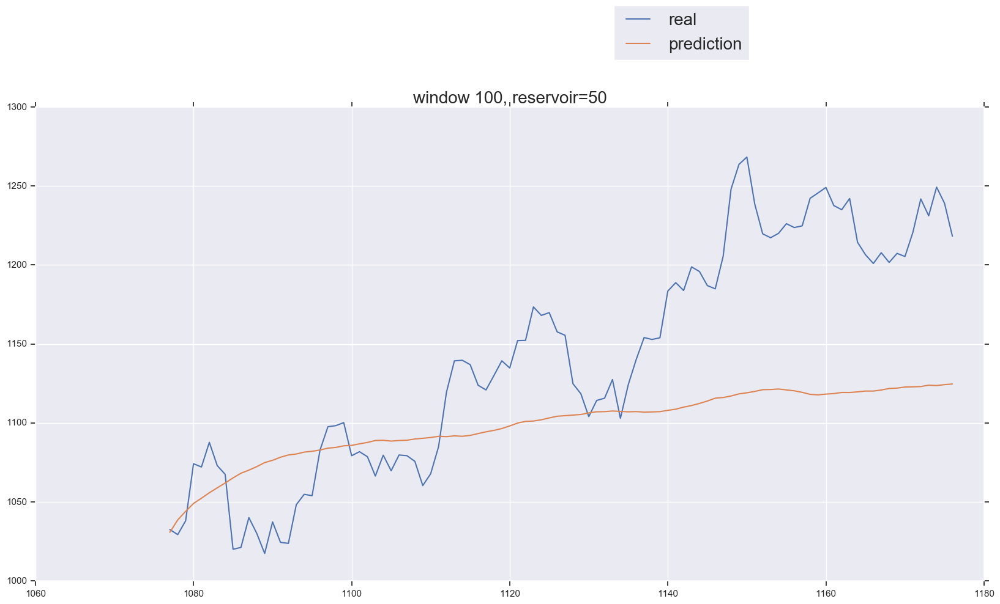

In [158]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.15, leaking_rate = 0.05, window = 100, plot=True)

MAPE: 0.0664331889889716
MEDAPE: 0.062773686640688
DEV: 78.68149477300463


(0.0664331889889716, 0.062773686640688, 78.68149477300463)

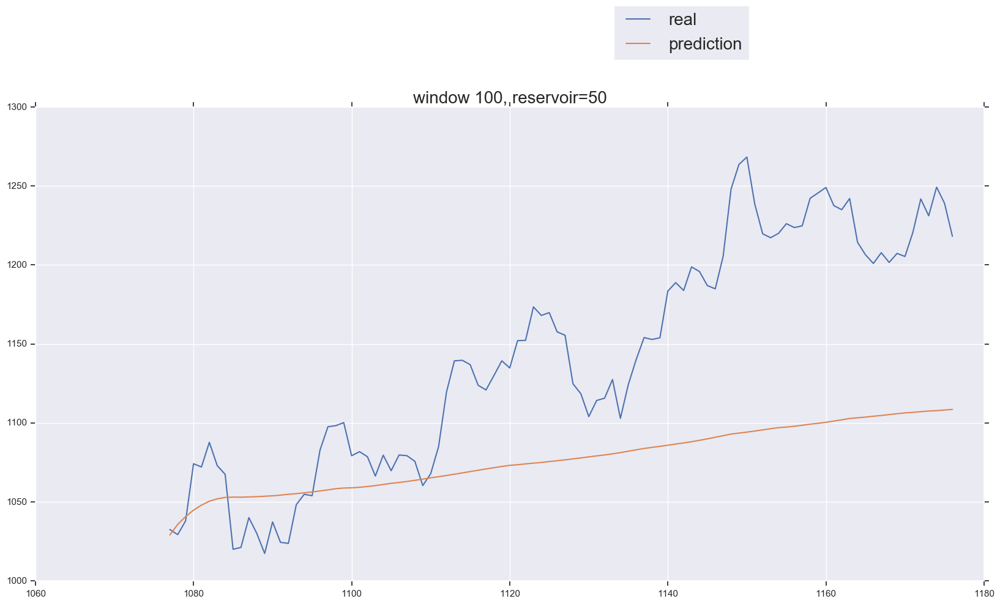

In [194]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.15, leaking_rate = 0.05, window = 100, plot=True)

## Spectral radius

Этот параметр отвечает за "echo state property" (значения параметра меньше 1 в большинстве случаев достаточны для выполнения этого свойства) и за глубину памяти - как много предыдущих значений влияют на текущее состояние резервуара. Чем больше значение параметра - тем больше сеть "помнит". При больших значениях сеть пытается воспроизводить уже случившиеся события (например тренды), при меньших - ее текущее состояние зависит только от недавних событий. Оптимальное значение параметра зависит от свойств временного ряда, глубина памяти может как и улучшить точность предсказаний, так и наоборот. Снизу демонстрируется, как меняется предсказание сети при различных значениях этого параметра

MAPE: 0.08177064543735309
MEDAPE: 0.08079033470996827
DEV: 92.86375344991777


(0.08177064543735309, 0.08079033470996827, 92.86375344991777)

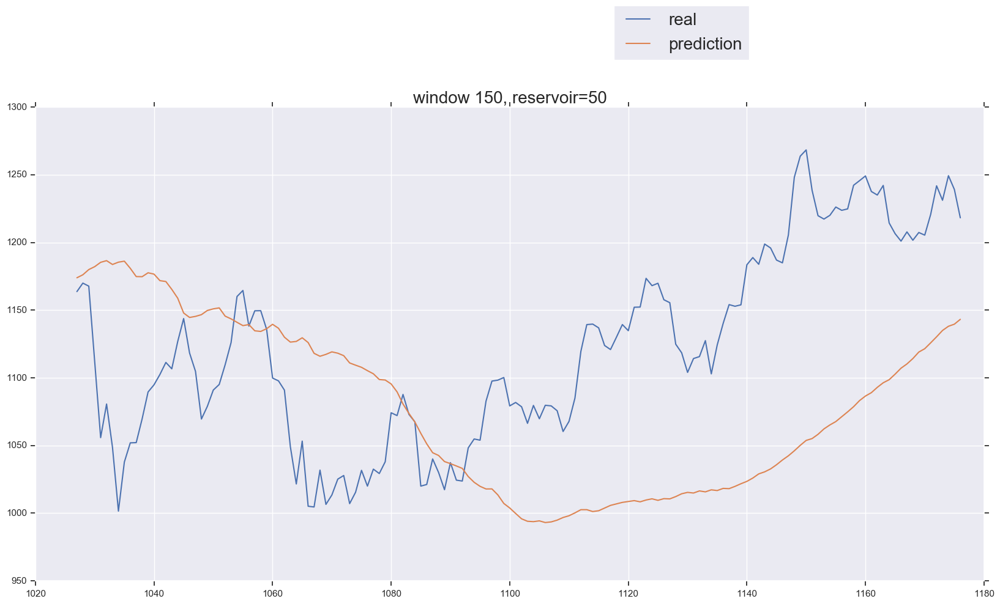

In [188]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.1, leaking_rate = 0.2, spectral_rad=0.9, plot=True, iterations=1)

MAPE: 0.12424052646369584
MEDAPE: 0.12577923700410265
DEV: 136.04485791072284


(0.12424052646369584, 0.12577923700410265, 136.04485791072284)

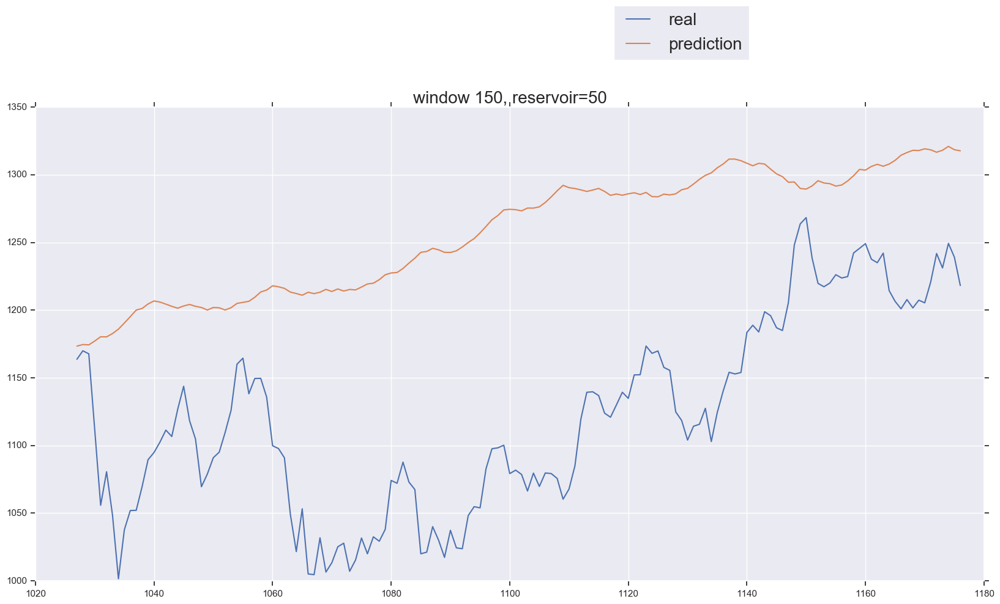

In [192]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.1, leaking_rate = 0.2, plot=True, iterations=1, spectral_rad=0.5)

MAPE: 0.19557138444235347
MEDAPE: 0.20799577516856943
DEV: 217.7945126911694


(0.19557138444235347, 0.20799577516856943, 217.7945126911694)

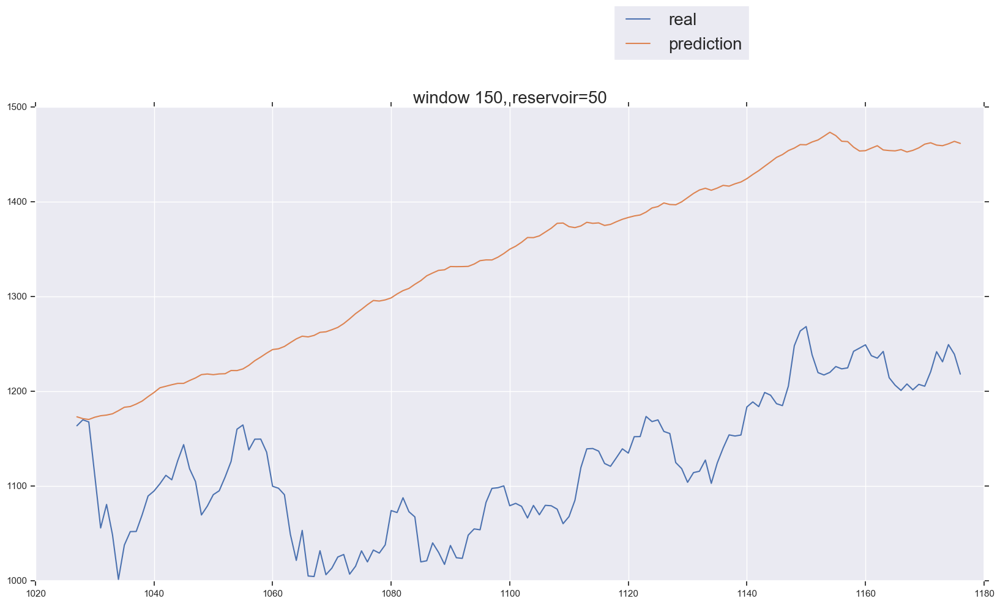

In [191]:
predict_esn_scaled(prices_df['GOOG'], reg_param=6e-1, res_density=0.1, leaking_rate = 0.2, plot=True, iterations=1, spectral_rad=0.2)